# Exploratory Text Analytics Final Project

Jae Hyun Lee (jl3fp@virginia.edu)  
DS 5001  
July 11, 2020  

Shakespeare voted millennium's best writer by BBC News, World (published on March 1, 1999)  
http://news.bbc.co.uk/2/hi/286082.stm

# 1. Convert

Convert the collection from their source formats (F0) into a set of tables that conform to the Standard Text Analytic Data Model (F2) and to the Machine Learning Corpus Format (F1).

## 1.1. Config

In [1]:
OHCO = ['book_id', 'chap_num', 'para_num', 'sent_num', 'token_num']
collection_dir = 'collection'
SENTS = OHCO[:4]
PARAS = OHCO[:3]
CHAPS = OHCO[:2]
BOOKS = OHCO[:1]

In [2]:
import pandas as pd
import numpy as np
from glob import glob
import re
import nltk

from sklearn.decomposition import PCA
from scipy.linalg import norm
import plotly_express as px
import seaborn as sns

sns.set(style='ticks')
%matplotlib inline

In [3]:
# define where actual text begins and ends
# define how chapters are segmented

roman = '[IVXLCM]+'
caps = "[A-Z';, -]+"
nums = "[0123456789';, -]+"
chap_pats = {
    # GASTON LEROUX
    1685: { # the mystery of the yellow room
        'start_line': 42,
        'end_line': 8597,
        'chapter': re.compile('^\s*CHAPTER\s+{}\..+$'.format(roman))
    },
    175: { # the phantom of the opera
        'start_line': 275,
        'end_line': 10446,
        'chapter': re.compile('^\s*(CHAPTER|Chapter)\s+{}.+$'.format(roman)) 
    },
    1686: { # the secret of the night
        'start_line': 74,
        'end_line': 11379,
        'chapter': re.compile("^\s*{}\. .*$".format(roman))
    },
    
    # ROBERT LOUIS STEVENSON
    421: { # kidnapped
        'start_line': 258,
        'end_line': 8452,
        'chapter': re.compile('^\s*CHAPTER\s+{}\s*$'.format(roman)) 
    },
    43: { # the starnge case of dr.jekyll and mr.hyde
        'start_line': 64,
        'end_line': 2586,
        'chapter': re.compile('^\s*{}\s*$'.format(caps))
    },
    120: { # treasure island
        'start_line': 42,
        'end_line': 8597,
        'chapter': re.compile('^\s*{}\s*$'.format(nums))
    },
    848: { # the black arrow
        'start_line': 676,
        'end_line': 9117,
        'chapter': re.compile('^\s*CHAPTER\s+{}[-\s].+\s*$'.format(roman)) 
    },
    
    # MARK TWAIN
    76: { # adventures of huckleberry finn
        'start_line': 545,
        'end_line': 11976,
        'chapter': re.compile('^\s*(CHAPTER|Chapter)\s+[IVXLCM]+\.\s*$') 
    },  
    74: { # the adventures of tom sawyer
        'start_line': 487,
        'end_line': 8850,
        'chapter': re.compile('^\s*CHAPTER\s+{}\s*$'.format(roman)) 
    },   
    1837: { # the prince and the pauper
        'start_line': 476,
        'end_line': 7904,
        'chapter': re.compile('^\s*CHAPTER\s+{}\..+\s*$'.format(roman)) 
    },
    3186: { # the mysterious stranger
        'start_line': 68,
        'end_line': 4258,
        'chapter': re.compile('^\s*(CHAPTER|Chapter)\s+{}\s*$'.format(nums)) 
    },  
    245: { # life on the mississippi
        'start_line': 42,
        'end_line': 14843,
        'chapter': re.compile('^\s*(CHAPTER|Chapter)\s+[IVXLCM]+\..*$') 
    },
    3176: { # the innocents abroad
        'start_line': 486,
        'end_line': 18754,
        'chapter': re.compile('^\s*CHAPTER\s+{}\.*\s*$'.format(roman)) 
    },     
    86: { # a connecticut yankee in king arthur's court
        'start_line': 368,
        'end_line': 12947,
        'chapter': re.compile('^\s*CHAPTER\s+{}\s*$'.format(roman)) 
    }, 
    
    # CHARLES DICKENS
    1400: { # great expectation
        'start_line': 110,
        'end_line': 20428,
        'chapter': re.compile('^\s*Chapter\s+{}\s*\.$'.format(roman)) 
    },
    766: { # david copperfield
        'start_line': 195,
        'end_line': 38225,
        'chapter': re.compile('^\s*CHAPTER\s+[0-9]{1,2}\..+$')
    },
    730: { # oliver twist
        'start_line': 154,
        'end_line': 18835,
        'chapter': re.compile('^\s*CHAPTER\s+{}\s*$'.format(roman)) 
    },
    
    # FYODOR DOSTOYEVSKY
    2554: { # crime and punishment
        'start_line': 140,
        'end_line': 22095,
        'chapter': re.compile('^\s*CHAPTER\s+{}\s*$'.format(roman)) 
    },
    
    # MIGUEL DE CERVANTES SAAVEDRA
    996: { # don quixote
        'start_line': 2646,
        'end_line': 42904,
        'chapter': re.compile('^\s*CHAPTER\s+{}\.+\s*$'.format(roman)) 
    }
}

### 1.2. LIB, DOC

In [4]:
# comprehend the texts into a single collection
def acquire_collection(collection_list, chap_pats, OHCO=OHCO):
    
    my_lib = []
    my_doc = []

    for collection_file in collection_list:

        # Import file as lines
        lines = open(collection_file, 'r', encoding='utf-8-sig').readlines()
        df = pd.DataFrame(lines, columns=['line_str'])
        df.index.name = 'line_num'
        df.line_str = df.line_str.str.strip()
                
        book_id = df[df['line_str'].str.contains('#')]['line_str'].iloc[0].split('#')[1]
        book_id = int(re.findall('[0-9]+', book_id)[0])
        print("BOOK ID", book_id)
        
        df['book_id'] = book_id
        
        # FIX CHARACTERS TO IMPROVE TOKENIZATION
        df.line_str = df.line_str.str.replace('—', ' — ')
        df.line_str = df.line_str.str.replace('-', ' - ')
        
        # Get book info
        book = df[df['line_str'].str.contains('Title')]['line_str'].iloc[0].split('Title: ')[1]
        author = df[df['line_str'].str.contains('Author')]['line_str'].iloc[0].split('Author: ')[1]
        year = df[df['line_str'].str.contains('Year')]['line_str'].iloc[0]
        year = re.findall('\d{4}', year)[0]
        genre = df[df['line_str'].str.contains('Genre')]['line_str'].iloc[0].split('Genre: ')[1]

        # Remove cruft
        a = chap_pats[book_id]['start_line'] - 1
        b = chap_pats[book_id]['end_line'] + 1
        df = df.iloc[a:b]
        
        # Chunk by chapter
        chap_lines = df.line_str.str.match(chap_pats[book_id]['chapter'])
        chap_nums = [i+1 for i in range(df.loc[chap_lines].shape[0])]
        df.loc[chap_lines, 'chap_num'] = chap_nums
        df.chap_num = df.chap_num.ffill()

        # Clean up
        df = df[~df.chap_num.isna()] # Remove chapter heading lines
        df = df.loc[~chap_lines] # Remove everything before Chapter 1
        df['chap_num'] = df['chap_num'].astype('int')
        
        # Group -- Note that we exclude the book level in the OHCO at this point
        df = df.groupby(OHCO[1:2]).line_str.apply(lambda x: '\n'.join(x)).to_frame() # Make big string
        
        # Split into paragrpahs
        df = df['line_str'].str.split(r'\n\n+', expand=True).stack().to_frame().rename(columns={0:'para_str'})
        df.index.names = OHCO[1:3] # MAY NOT BE NECESSARY UNTIL THE END
        df['para_str'] = df['para_str'].str.replace(r'\n', ' ').str.strip()
        df = df[~df['para_str'].str.match(r'^\s*$')] # Remove empty paragraphs
        
        # Set index
        df['book_id'] = book_id
        df = df.reset_index().set_index(OHCO[:3])

        # Register
        my_lib.append((book_id, book, author, year, genre, collection_file))
        my_doc.append(df)

    docs = pd.concat(my_doc)
    library = pd.DataFrame(my_lib, columns=['book_id', 'book', 'author', 'year', 'genre', 'book_file']).set_index('book_id')
    print("Done.")
    return library, docs

In [5]:
collections = [collection for collection in sorted(glob(collection_dir+'/*.txt'))]
LIB, DOC = acquire_collection(collections, chap_pats)

BOOK ID 766
BOOK ID 1400
BOOK ID 730
BOOK ID 2554
BOOK ID 1685
BOOK ID 175
BOOK ID 1686
BOOK ID 86
BOOK ID 76
BOOK ID 245
BOOK ID 74
BOOK ID 3176
BOOK ID 3186
BOOK ID 1837
BOOK ID 996
BOOK ID 421
BOOK ID 848
BOOK ID 43
BOOK ID 120
Done.


In [6]:
# note Mark Twain has his real name included in most of the books
LIB

,book,author,year,genre,book_file
book_id,,,,,
766,David Copperfield,Charles Dickens,1849,Bildungsroman,collection\CHARLES_DICKENS_david_copperfield_7...
1400,Great Expectations,Charles Dickens,1860,Bildungsroman,collection\CHARLES_DICKENS_great_expectations_...
730,Oliver Twist,Charles Dickens,1837,Social novel,collection\CHARLES_DICKENS_oliver_twist_pg730.txt
2554,Crime and Punishment,Fyodor Dostoevsky,1866,Philosophical,collection\FYODOR_DOSTOYEVSKY_crime_and_punish...
1685,The Mystery of “The Yellow Room”,Gaston Leroux,1907,Mystery,collection\GASTON_LEROUX_the_mystery_of_the_ye...
175,The Phantom of the Opera,Gaston Leroux,1909,Mystery,collection\GASTON_LEROUX_the_phantom_of_the_op...
1686,The Secret of the Night,Gaston Leroux,1913,Mystery,collection\GASTON_LEROUX_the_secret_of_the_nig...
86,"A Connecticut Yankee in King Arthur's Court, C...",Mark Twain (Samuel Clemens),1889,Science Fiction,collection\MARK_TWAIN_a_connecticut_yankee_in_...
76,"Adventures of Huckleberry Finn, Complete",Mark Twain (Samuel Clemens),1884,Picaresque novel,collection\MARK_TWAIN_adventures_of_huckleberr...


In [7]:
# correcting Mark Twain
LIB.author = np.where(LIB.author=='Mark Twain (Samuel Clemens)', 'Mark Twain', LIB.author)

In [8]:
DOC.sample(10)

para_str
book_id chap_num para_num                                                   
421     20       43        Presently we began again to get a little stren...
996     55       45        “The reason of that,” said Samson, “is, that a...
848     23       20        "Nay, but against traitors, my lord, are not a...
245     60       813       The further we drove in our inspection - tour,...
2554    37       47        A thick milky mist hung over the town. Svidrig...
86      44       0                                  A POSTSCRIPT BY CLARENCE
3176    23       26        If I did not so delight in the grand pictures ...
        51       14        “199.  They carry themselves high, and as prud...
120     4        3         It was already candle - light when we reached ...
1837    13       37        “Out of my sight, idiot!  Thy prating drives m...

### 1.3. TOKEN

In [9]:
def tokenize(doc_df, OHCO=OHCO, remove_pos_tuple=False, ws=False):
    
    # Paragraphs to Sentences
    df = doc_df.para_str\
        .apply(lambda x: pd.Series(nltk.sent_tokenize(x)))\
        .stack()\
        .to_frame()\
        .rename(columns={0:'sent_str'})
    
    # Sentences to Tokens
    # Local function to pick tokenizer
    def word_tokenize(x):
        if ws:
            s = pd.Series(nltk.pos_tag(nltk.WhitespaceTokenizer().tokenize(x)))
        else:
            s = pd.Series(nltk.pos_tag(nltk.word_tokenize(x))) # Discards stuff in between
        return s
            
    df = df.sent_str\
        .apply(word_tokenize)\
        .stack()\
        .to_frame()\
        .rename(columns={0:'pos_tuple'})
    
    # Grab info from tuple
    df['pos'] = df.pos_tuple.apply(lambda x: x[1])
    df['token_str'] = df.pos_tuple.apply(lambda x: x[0])
    if remove_pos_tuple:
        df = df.drop('pos_tuple', 1)
    
    # Add index
    df.index.names = OHCO
    
    return df

In [10]:
# takes some time
TOKEN = tokenize(DOC, ws=False)

In [11]:
TOKEN.head(10)

pos_tuple  pos token_str
book_id chap_num para_num sent_num token_num                              
766     1        1        0        0          (Whether, IN)   IN   Whether
                                   1               (I, PRP)  PRP         I
                                   2            (shall, MD)   MD     shall
                                   3             (turn, VB)   VB      turn
                                   4              (out, RP)   RP       out
                                   5               (to, TO)   TO        to
                                   6               (be, VB)   VB        be
                                   7              (the, DT)   DT       the
                                   8             (hero, NN)   NN      hero
                                   9               (of, IN)   IN        of

### 1.4. VOCAB

In [12]:
TOKEN['term_str'] = TOKEN['token_str'].str.lower().str.replace('[\W_]', '')

VOCAB = TOKEN.term_str.value_counts().to_frame()\
    .rename(columns={'index':'term_str', 'term_str':'n'})\
    .sort_index().reset_index().rename(columns={'index':'term_str'})
VOCAB.index.name = 'term_id'

VOCAB['num'] = VOCAB.term_str.str.match("\d+").astype('int')

In [13]:
VOCAB.head()

,term_str,n,num
term_id,,,
0,,534353,0
1,02,1,1
2,0txt,1,1
3,0zip,1,1
4,1,61,1


# 2. Annotate

## 2.1. Stopwords

In [14]:
sw = pd.DataFrame(nltk.corpus.stopwords.words('english'), columns=['term_str'])
sw = sw.reset_index().set_index('term_str')
sw.columns = ['dummy']
sw.dummy = 1

In [15]:
VOCAB['stop'] = VOCAB.term_str.map(sw.dummy)
VOCAB['stop'] = VOCAB['stop'].fillna(0).astype('int')

In [16]:
VOCAB[VOCAB.stop == 1].head(10)

,term_str,n,num,stop
term_id,,,,
535,a,57991,0,1
632,about,5045,0,1
633,above,698,0,1
1148,after,3001,0,1
1156,again,3366,0,1
1157,against,1184,0,1
1262,ain,168,0,1
1400,all,12824,0,1
1531,am,3570,0,1


## 2.2. Stems

In [17]:
from nltk.stem.porter import PorterStemmer
stemmer1 = PorterStemmer()
VOCAB['stem_porter'] = VOCAB.term_str.apply(stemmer1.stem)

from nltk.stem.snowball import SnowballStemmer
stemmer2 = SnowballStemmer("english")
VOCAB['stem_snowball'] = VOCAB.term_str.apply(stemmer2.stem)

from nltk.stem.lancaster import LancasterStemmer
stemmer3 = LancasterStemmer()
VOCAB['stem_lancaster'] = VOCAB.term_str.apply(stemmer3.stem)

## 2.3. Term ID (TOKEN), POS_max and Term Rank (VOCAB)

In [18]:
# replace blank (white space) to np.NaN
TOKEN = TOKEN.replace(r'^\s*$', np.NaN, regex=True)
VOCAB = VOCAB.replace(r'^\s*$', np.NaN, regex=True)

# filter rows where 'term_str' is missing
TOKEN = TOKEN[~TOKEN.term_str.isna()]
VOCAB = VOCAB[~VOCAB.term_str.isna()]

# map 'term_id' to TOKEN from VOCAB on 'term_str'
TOKEN['term_id'] = TOKEN.term_str.map(VOCAB.reset_index().set_index('term_str').term_id)

# add 'pos_max'
VOCAB['pos_max'] = TOKEN.groupby(['term_id', 'pos']).pos.count().unstack().idxmax(1)

# add Term Rank to VOCAB
if 'term_rank' not in VOCAB.columns:
    VOCAB = VOCAB.sort_values('n', ascending=False).reset_index()
    VOCAB.index.name = 'term_rank'
    VOCAB = VOCAB.reset_index()
    VOCAB = VOCAB.set_index('term_id')
    VOCAB['term_rank'] = VOCAB['term_rank'] + 1

## 2.4. Zipf's K, Entropy (VOCAB)

In [19]:
# Compute Zipf's K
VOCAB['zipf_k'] = VOCAB.n * VOCAB.term_rank

# VOCAB Entropy
# Compute P of VOCAB
VOCAB['p'] = VOCAB.n / VOCAB.n.sum()

# Compute Entropy of VOCAB
VOCAB['h'] = VOCAB.p * np.log2(1/VOCAB.p) # Self entropy of each word 
H = VOCAB.h.sum()
N_v = VOCAB.shape[0]
H_max = np.log2(N_v)
R = round(1 - (H/H_max), 2) * 100

In [20]:
TOKEN = TOKEN.reset_index().merge(LIB, how='left', left_on='book_id', right_on='book_id')

In [22]:
TOKEN = TOKEN.set_index(OHCO)

In [23]:
VOCAB.head()

,term_rank,term_str,n,num,stop,stem_porter,stem_snowball,stem_lancaster,pos_max,zipf_k,p,h
term_id,,,,,,,,,,,,
34766,1,the,134708,0,1,the,the,the,DT,134708,0.051778,0.221171
1684,2,and,100318,0,1,and,and,and,CC,200636,0.038560,0.181106
35240,3,to,69743,0,1,to,to,to,TO,209229,0.026807,0.139968
23839,4,of,66849,0,1,of,of,of,IN,267396,0.025695,0.135731
535,5,a,57991,0,1,a,a,a,DT,289955,0.022290,0.122316


In [24]:
TOKEN.head()

book_id  \
author          year book              chap_num para_num sent_num token_num            
Charles Dickens 1849 David Copperfield 1        1        0        0              766   
                                                                  1              766   
                                                                  2              766   
                                                                  3              766   
                                                                  4              766   

                                                                                 pos_tuple  \
author          year book              chap_num para_num sent_num token_num                  
Charles Dickens 1849 David Copperfield 1        1        0        0          (Whether, IN)   
                                                                  1               (I, PRP)   
                                                                  2            (shall, MD)   
                                                                  3             (turn, VB)   
                                                                  4              (out, RP)   

                                                                             pos  \
author          year book              chap_num para_num sent_num token_num        
Charles Dickens 1849 David Copperfield 1        1        0        0           IN   
                                                                  1          PRP   
                                                                  2           MD   
                                                                  3           VB   
                                                                  4           RP   

                                                                            token_str  \
author          year book              chap_num para_num sent_num token_num             
Charles Dickens 1849 David Copperfield 1        1        0        0           Whether   
                                                                  1                 I   
                                                                  2             shall   
                                                                  3              turn   
                                                                  4               out   

                                                                            term_str  \
author          year book              chap_num para_num sent_num token_num            
Charles Dickens 1849 David Copperfield 1        1        0        0          whether   
                                                                  1                i   
                                                                  2            shall   
                                                                  3             turn   
                                                                  4              out   

                                                                             term_id  \
author          year book              chap_num para_num sent_num token_num            
Charles Dickens 1849 David Copperfield 1        1        0        0            38470   
                                                                  1            17423   
                                                                  2            31016   
                                                                  3            36019   
                                                                  4            24218   

                                                                                     genre  \
author          year book              chap_num para_num sent_num token_num                  
Charles Dickens 1849 David Copperfield 1        1        0        0          Bildungsroman   
                                                                  1     

### Save Progress
End of Phase 1

In [25]:
DOC1 = DOC
LIB1 = LIB
VOCAB1 = VOCAB
TOKEN1 = TOKEN

In [26]:
DOC.to_csv('DOC.csv')
LIB.to_csv('LIB.csv')
VOCAB.to_csv('VOCAB.csv')
TOKEN.to_csv('TOKEN.csv')

# 3. TFIDF

In [21]:
# new OHCO levels
OHCO = ['author','year','book','chap_num','para_num','sent_num','token_num']

SENTS = OHCO[:6]
PARAS = OHCO[:5]
CHAPS = OHCO[:4]
BOOKS = OHCO[:3]
YEARS = OHCO[:2]
AUTHR = OHCO[:1]

In [27]:
def get_TFIDF(TOKEN, bag, count_method, tf_method, idf_method):
    # declaring VOCAB as a global variable since it's not one of the parameters in this function
    global VOCAB
    try:       
        # create bag-of-words
        BOW = TOKEN.groupby(bag+['term_id']).term_id.count()\
            .to_frame().rename(columns={'term_id':'n'})
        BOW['c'] = BOW.n.astype('bool').astype('int')
        
        # create Document Term Count Matrix
        DTCM = BOW[count_method].unstack().fillna(0).astype('int')
        
        # compute TF
        if tf_method == 'sum':
            TF = DTCM.T / DTCM.T.sum()

        elif tf_method == 'max':
            TF = DTCM.T / DTCM.T.max()

        elif tf_method == 'log':
            TF = np.log10(1 + DTCM.T)

        elif tf_method == 'raw':
            TF = DTCM.T

        elif tf_method == 'double_norm':
            TF = DTCM.T / DTCM.T.max()
            TF = tf_norm_k + (1 - tf_norm_k) * TF[TF > 0] # EXPLAIN; may defeat purpose of norming

        elif tf_method == 'binary':
            TF = DTCM.T.astype('bool').astype('int')

        TF = TF.T
        
        # compute DF
        DF = DTCM[DTCM > 0].count()
        
        # compute IDF
        N = DTCM.shape[0]
        
        if idf_method == 'standard':
            IDF = np.log10(N / DF)

        elif idf_method == 'max':
            IDF = np.log10(DF.max() / DF) 

        elif idf_method == 'smooth':
            IDF = np.log10((1 + N) / (1 + DF)) + 1
        
        # compute TFIDF
        TFIDF = TF * IDF
        
        # organize
        VOCAB['df'] = DF
        VOCAB['idf'] = IDF

        BOW['tf'] = TF.stack()
        
        BOW['tfidf'] = TFIDF.stack()

        # Apply TFIDF sum to VOCAB
        VOCAB['tfidf_mean'] = TFIDF[TFIDF > 0].mean().fillna(0)
        VOCAB['tfidf_sum'] = TFIDF.sum()
        VOCAB['tfidf_median'] = TFIDF[TFIDF > 0].median().fillna(0)
        VOCAB['tfidf_max'] = TFIDF.max()
        
        # Word-Context Matrix Entropy
        WCM = DTCM / DTCM.sum()
        WCMh = WCM * np.log2(1/WCM)

        VOCAB['h2'] = WCMh.sum()

        VOCAB['x_factor'] = np.log(VOCAB.term_rank) * VOCAB.h2
        
        return TFIDF, BOW, VOCAB
    except KeyError as e:
        print('Error:', e)
        return None

In [28]:
# get TFIDF using BOOKS as a bag
TFIDF, BOW, VOCAB = get_TFIDF(TOKEN, BOOKS, 'n', 'sum', 'standard')

In [29]:
# top 20 words when using BOOKS as a bag
BOOKS_top20 = VOCAB[['term_rank','term_str','pos_max','tfidf_sum']]\
.sort_values('tfidf_sum', ascending=False).head(20)

BOOKS_top20.style.background_gradient(cmap='YlGnBu', high=1)

,term_rank,term_str,pos_max,tfidf_sum
term_id,,,,
23584,63,nt,RB,0.013747
29635,277,rouletabille,NNP,0.0113131
32985,597,stangerson,NNP,0.0070232
30045,149,sancho,NNP,0.00670649
22471,347,monsieur,NNP,0.00660434
6519,571,christine,NNP,0.00657527
37302,1675,utterson,NNP,0.00646808
27974,656,raoul,NNP,0.00551474
23047,589,natacha,NNP,0.00536876


In [30]:
TOKEN.head()

book_id  \
author          year book              chap_num para_num sent_num token_num            
Charles Dickens 1849 David Copperfield 1        1        0        0              766   
                                                                  1              766   
                                                                  2              766   
                                                                  3              766   
                                                                  4              766   

                                                                                 pos_tuple  \
author          year book              chap_num para_num sent_num token_num                  
Charles Dickens 1849 David Copperfield 1        1        0        0          (Whether, IN)   
                                                                  1               (I, PRP)   
                                                                  2            (shall, MD)   
                                                                  3             (turn, VB)   
                                                                  4              (out, RP)   

                                                                             pos  \
author          year book              chap_num para_num sent_num token_num        
Charles Dickens 1849 David Copperfield 1        1        0        0           IN   
                                                                  1          PRP   
                                                                  2           MD   
                                                                  3           VB   
                                                                  4           RP   

                                                                            token_str  \
author          year book              chap_num para_num sent_num token_num             
Charles Dickens 1849 David Copperfield 1        1        0        0           Whether   
                                                                  1                 I   
                                                                  2             shall   
                                                                  3              turn   
                                                                  4               out   

                                                                            term_str  \
author          year book              chap_num para_num sent_num token_num            
Charles Dickens 1849 David Copperfield 1        1        0        0          whether   
                                                                  1                i   
                                                                  2            shall   
                                                                  3             turn   
                                                                  4              out   

                                                                             term_id  \
author          year book              chap_num para_num sent_num token_num            
Charles Dickens 1849 David Copperfield 1        1        0        0            38470   
                                                                  1            17423   
                                                                  2            31016   
                                                                  3            36019   
                                                                  4            24218   

                                                                                     genre  \
author          year book              chap_num para_num sent_num token_num                  
Charles Dickens 1849 David Copperfield 1        1        0        0          Bildungsroman   
                                                                  1     

In [31]:
VOCAB.head()

,term_rank,term_str,n,num,stop,stem_porter,stem_snowball,stem_lancaster,pos_max,zipf_k,p,h,df,idf,tfidf_mean,tfidf_sum,tfidf_median,tfidf_max,h2,x_factor
term_id,,,,,,,,,,,,,,,,,,,,
34766,1,the,134708,0,1,the,the,the,DT,134708,0.051778,0.221171,19,0.0,0.0,0.0,0.0,0.0,3.998123,0.000000
1684,2,and,100318,0,1,and,and,and,CC,200636,0.038560,0.181106,19,0.0,0.0,0.0,0.0,0.0,3.920450,2.717449
35240,3,to,69743,0,1,to,to,to,TO,209229,0.026807,0.139968,19,0.0,0.0,0.0,0.0,0.0,3.841898,4.220756
23839,4,of,66849,0,1,of,of,of,IN,267396,0.025695,0.135731,19,0.0,0.0,0.0,0.0,0.0,3.866923,5.360694
535,5,a,57991,0,1,a,a,a,DT,289955,0.022290,0.122316,19,0.0,0.0,0.0,0.0,0.0,3.977644,6.401771


In [32]:
TFIDF.head()

term_id                                                  1      2      3      \
author            year book                                                    
Charles Dickens   1837 Oliver Twist                        0.0    0.0    0.0   
                  1849 David Copperfield                   0.0    0.0    0.0   
                  1860 Great Expectations                  0.0    0.0    0.0   
Fyodor Dostoevsky 1866 Crime and Punishment                0.0    0.0    0.0   
Gaston Leroux     1907 The Mystery of “The Yellow Room”    0.0    0.0    0.0   

term_id                                                     4      5      \
author            year book                                                
Charles Dickens   1837 Oliver Twist                      0.000000    0.0   
                  1849 David Copperfield                 0.000000    0.0   
                  1860 Great Expectations                0.000001    0.0   
Fyodor Dostoevsky 1866 Crime and Punishment              0.000000    0.0   
Gaston Leroux     1907 The Mystery of “The Yellow Room”  0.000010    0.0   

term_id                                                  6      7      8      \
author            year book                                                    
Charles Dickens   1837 Oliver Twist                        0.0    0.0    0.0   
                  1849 David Copperfield                   0.0    0.0    0.0   
                  1860 Great Expectations                  0.0    0.0    0.0   
Fyodor Dostoevsky 1866 Crime and Punishment                0.0    0.0    0.0   
Gaston Leroux     1907 The Mystery of “The Yellow Room”    0.0    0.0    0.0   

term_id                                                  9      10     ...  \
author            year book                                            ...   
Charles Dickens   1837 Oliver Twist                        0.0    0.0  ...   
                  1849 David Copperfield                   0.0    0.0  ...   
                  1860 Great Expectations                  0.0    0.0  ...   
Fyodor Dostoevsky 1866 Crime and Punishment                0.0    0.0  ...   
Gaston Leroux     1907 The Mystery of “The Yellow Room”    0.0    0.0  ...   

term_id                                                  39318  39319  39320  \
author            year book                                                    
Charles Dickens   1837 Oliver Twist                        0.0    0.0    0.0   
                  1849 David Copperfield                   0.0    0.0    0.0   
                  1860 Great Expectations                  0.0    0.0    0.0   
Fyodor Dostoevsky 1866 Crime and Punishment                0.0    0.0    0.0   
Gaston Leroux     1907 The Mystery of “The Yellow Room”    0.0    0.0    0.0   

term_id                                                     39321     39322  \
author            year book                                                   
Charles Dickens   1837 Oliver Twist                      0.000000  0.000000   
                  1849 David Copperfield                 0.000000  0.000000   
                  1860 Great Expectations                0.000000  0.000000   
Fyodor Dostoevsky 1866 Crime and Punishment              0.000006  0.000006   
Gaston Leroux     1907 The Mystery of “The Yellow Room”  0.000000  0.000000   

term_id                                                     39323     39324  \
author            year book                                                   
Charles Dickens   1837 Oliver Twist                      0.000000  0.000000   
                  1849 David Copperfield                 0.000000  0.000000   
                  1860 Great Expectations                0.000000  0.000000   
Fyodor Dostoevsky 1866 Crime and Punishment              0.000006  0.000006   
Gaston Leroux     1907 The Mystery of “The Yellow Room”  0.000000  0.000000   

term_id                                                     39325  39326  \
author            year book                          

In [33]:
BOW.head()

n  c        tf     tfidf
author          year book         term_id                             
Charles Dickens 1837 Oliver Twist 535      3761  1  0.023319  0.000000
                                  542         1  1  0.000006  0.000001
                                  543         1  1  0.000006  0.000001
                                  547         1  1  0.000006  0.000006
                                  553         1  1  0.000006  0.000003

In [34]:
# top 20 words when using CHAPS as a bag
TFIDF, BOW, VOCAB = get_TFIDF(TOKEN, CHAPS, 'n', 'sum', 'standard')

CHAPS_top20 = VOCAB[['term_rank','term_str','pos_max','tfidf_sum']]\
.sort_values('tfidf_sum', ascending=False).head(20)\

CHAPS_top20.style.background_gradient(cmap='YlGnBu', high=1)

,term_rank,term_str,pos_max,tfidf_sum
term_id,,,,
27827,12782,racing,VBG,1.05018
23584,63,nt,RB,0.82963
22738,67,mr,NNP,0.654856
29427,303,river,NN,0.638769
34766,1,the,DT,0.628852
30045,149,sancho,NNP,0.602165
27788,151,quixote,NNP,0.579746
35240,3,to,TO,0.544751
22781,2658,mule,NN,0.532463


## Save Progress 2
End of Phase 2

In [35]:
DOC2 = DOC
LIB2 = LIB
VOCAB2 = VOCAB
TOKEN2 = TOKEN
TFIDF2 = TFIDF
BOW2 = BOW

In [36]:
DOC.to_csv('DOC2.csv')
LIB.to_csv('LIB2.csv')
VOCAB.to_csv('VOCAB2.csv')
TOKEN.to_csv('TOKEN2.csv')
TFIDF.to_csv('TFIDF2.csv')
BOW.to_csv('BOW2.csv')

# 4. Analysis

## 4.1. Principal Components (PCA)

### 4.1.1. Prepare

In [37]:
count_method = 'c' # 'c' or 'n' # n = n tokens, c = distinct token (term) count
tf_method = 'raw' # sum, max, log, double_norm, raw, binary
tf_norm_k = .5 # only used for double_norm
idf_method = 'standard' # standard, max, smooth
gradient_cmap = 'GnBu' # YlGn, GnBu, YlGnBu; For tables; see https://matplotlib.org/3.1.0/tutorials/colors/colormaps.html 

In [38]:
VOCAB_idx = VOCAB.sort_values('tfidf_sum',ascending = False).head(4000)

In [39]:
VOCAB_idx.head()

,term_rank,term_str,n,num,stop,stem_porter,stem_snowball,stem_lancaster,pos_max,zipf_k,p,h,df,idf,tfidf_mean,tfidf_sum,tfidf_median,tfidf_max,h2,x_factor
term_id,,,,,,,,,,,,,,,,,,,,
27827,12782,racing,8,0,0,race,race,rac,VBG,102256,0.000003,0.000056,5,2.203577,0.210036,1.050180,0.000523,0.734526,2.000000,18.911586
23584,63,nt,5176,0,0,nt,nt,nt,RB,326088,0.001990,0.017853,284,0.449228,0.002921,0.829630,0.001762,0.027226,7.239944,29.996064
22738,67,mr,4990,0,0,mr,mr,mr,NNP,334330,0.001918,0.017312,274,0.464796,0.002390,0.654856,0.001239,0.058100,7.113525,29.910185
29427,303,river,909,0,0,river,river,riv,NN,275427,0.000349,0.004012,157,0.706647,0.004069,0.638769,0.000423,0.353324,4.115013,23.512084
34766,1,the,134708,0,1,the,the,the,DT,134708,0.051778,0.221171,772,0.014929,0.000815,0.628852,0.000786,0.004266,9.070591,0.000000


In [40]:
INDEX = VOCAB_idx.index.tolist()

In [41]:
TFIDF_REDUCED = TFIDF.T.loc[INDEX]
TFIDF_REDUCED = TFIDF_REDUCED.T
TFIDF_REDUCED

term_id                                               27827     23584  \
author                 year book            chap_num                    
Charles Dickens        1837 Oliver Twist    1           0.0  0.000398   
                                            2           0.0  0.000895   
                                            3           0.0  0.001708   
                                            4           0.0  0.002221   
                                            5           0.0  0.002171   
                                            6           0.0  0.001763   
                                            7           0.0  0.001888   
                                            8           0.0  0.001079   
                                            9           0.0  0.001509   
                                            10          0.0  0.001469   
                                            11          0.0  0.001183   
                                            12          0.0  0.002446   
                                            13          0.0  0.002324   
                                            14          0.0  0.002648   
                                            15          0.0  0.002959   
                                            16          0.0  0.003957   
                                            17          0.0  0.002597   
                                            18          0.0  0.003642   
                                            19          0.0  0.003715   
                                            20          0.0  0.001769   
                                            21          0.0  0.001215   
                                            22          0.0  0.001063   
                                            23          0.0  0.001931   
                                            24          0.0  0.001991   
                                            25          0.0  0.003517   
                                            26          0.0  0.001761   
                                            27          0.0  0.002802   
                                            28          0.0  0.001936   
                                            29          0.0  0.001600   
                                            30          0.0  0.001692   
...                                                     ...       ...   
Robert Louis Stevenson 1888 The Black Arrow 3           0.0  0.000000   
                                            4           0.0  0.000000   
                                            5           0.0  0.000161   
                                            6           0.0  0.000000   
                                            7           0.0  0.000000   
                                            8           0.0  0.000324   
                                            9           0.0  0.000179   
                                            10          0.0  0.000206   
                                            11          0.0  0.000000   
                                            12          0.0  0.000000   
                                            13          0.0  0.000000   
                                            14          0.0  0.000000   
                                            15          0.0  0.000412   
                                            16          0.0  0.000000   
                                            17          0.0  0.000218   
                                            18          0.0  0.000000   
                                            19          0.0  0.000177   
                                            20          0.0  0.000000   
                                            21          0.0  0.000358   
                                            22          0.0  0.000000   
                                            23          0.0  0.000000   
                                            24          0.

### 4.1.2. Preprocess the TFIF Matrices

In [42]:
# normalize doc vector lengths
TFIDF_REDUCED = TFIDF_REDUCED.apply(lambda x: x / norm(x), 1)

# center the word vectors
TFIDF_REDUCED = TFIDF_REDUCED - TFIDF_REDUCED.mean()

In [43]:
# compute covariance matrix
COV = TFIDF_REDUCED.cov()
COV.head()

term_id,27827,23584,22738,29427,34766,30045,27788,35240,22781,35303,...,15222,12234,9722,27484,3834,14739,1724,12551,28104,26871
term_id,,,,,,,,,,,,,,,,,,,,,
27827,0.001090,-0.000087,-0.000050,-0.000011,-0.000066,-0.000053,-0.000055,-0.000058,5.137162e-04,-0.000052,...,-0.000002,-0.000002,-0.000002,-0.000002,-2.214983e-06,-0.000002,-0.000002,-0.000002,-1.425210e-06,-0.000002
23584,-0.000087,0.013088,-0.000956,0.000745,0.000008,-0.002265,-0.002188,0.000085,-1.407039e-04,0.003898,...,0.000011,0.000033,-0.000034,-0.000038,1.047912e-04,0.000054,-0.000038,-0.000031,-4.576832e-05,-0.000029
22738,-0.000050,-0.000956,0.004354,-0.000134,-0.000209,-0.001332,-0.001296,-0.000018,-1.028396e-04,-0.000743,...,-0.000007,-0.000001,-0.000008,0.000083,-1.880272e-05,-0.000034,0.000013,-0.000004,2.534886e-05,0.000017
29427,-0.000011,0.000745,-0.000134,0.001250,0.000014,-0.000259,-0.000272,-0.000010,-1.810592e-05,0.000078,...,-0.000003,-0.000003,-0.000009,-0.000007,-7.834492e-07,-0.000010,-0.000002,-0.000005,-5.528124e-07,-0.000006
34766,-0.000066,0.000008,-0.000209,0.000014,0.000449,0.000095,0.000166,0.000252,6.951807e-07,-0.000119,...,0.000018,0.000006,0.000010,0.000005,8.046050e-06,-0.000011,-0.000002,0.000015,6.799422e-06,0.000015


In [44]:
# decompose the matrix
from scipy.linalg import eigh as eig
eig_vals, eig_vecs = eig(COV)

In [45]:
# convert eigen data to dataframes
TERM_IDX = COV.index # We could use other tables as well, e.g. TFIDF_b, TFIDF_c, or COV_c

EIG_VEC = pd.DataFrame(eig_vecs, index=TERM_IDX, columns=TERM_IDX)

EIG_VAL = pd.DataFrame(eig_vals, index=TERM_IDX, columns=['eig_val'])
EIG_VAL.index.name = 'term_id'

### 4.1.3. Select Principal Components

In [46]:
# combine eigenvalues and eigenvectors
EIG_PAIRS = EIG_VAL.join(EIG_VEC.T)

# compute and show explained variance
EIG_PAIRS['exp_var'] = np.round((EIG_PAIRS.eig_val / EIG_PAIRS.eig_val.sum()) * 100, 2)

In [47]:
# pick top 10 components
TOPS = EIG_PAIRS.sort_values('exp_var', ascending=False).head(10).reset_index(drop=True)
TOPS.index.name = 'comp_id'
TOPS.index = ["PC{}".format(i) for i in TOPS.index.tolist()]

# show loadings
LOADINGS = TOPS[TERM_IDX].T
LOADINGS.index.name = 'term_id'

LOADINGS['term_str'] = LOADINGS.apply(lambda x: VOCAB.loc[int(x.name)].term_str, 1)

lb0_pos = LOADINGS.sort_values('PC0', ascending=True).head(10).term_str.str.cat(sep=' ')
lb0_neg = LOADINGS.sort_values('PC0', ascending=False).head(10).term_str.str.cat(sep=' ')
lb1_pos = LOADINGS.sort_values('PC1', ascending=True).head(10).term_str.str.cat(sep=' ')
lb1_neg = LOADINGS.sort_values('PC1', ascending=False).head(10).term_str.str.cat(sep=' ')

print('Books PC0+', lb0_pos)
print('Books PC0-', lb0_neg)
print('Books PC1+', lb1_pos)
print('Books PC1-', lb1_neg)

Books PC0+ sancho quixote don thou thee knight worship señor thy dulcinea
Books PC0- nt tom jim mr joe huck ai oliver dick aunt
Books PC1+ rouletabille dick mr monsieur micawber stangerson ye t darzac peggotty
Books PC1- nt tom jim huck ai sancho says quixote nigger d


### 4.1.4. Project Docs onto New Subspace

In [48]:
DCM = TFIDF_REDUCED.dot(TOPS[TERM_IDX].T)
DCM = DCM.merge(LIB, how='left', left_on='book', right_on='book')

In [49]:
DCM

,book,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,author,year,genre,book_file
0,Oliver Twist,0.075367,-0.087747,0.015620,-0.090102,-0.024068,-0.249438,-0.182879,-0.019204,0.084273,-0.066349,Charles Dickens,1837,Social novel,collection\CHARLES_DICKENS_oliver_twist_pg730.txt
1,Oliver Twist,0.095695,-0.098073,0.017617,-0.144841,0.031318,-0.358532,-0.197367,0.000750,0.070787,-0.070921,Charles Dickens,1837,Social novel,collection\CHARLES_DICKENS_oliver_twist_pg730.txt
2,Oliver Twist,0.098086,-0.088778,0.020512,-0.146371,0.035847,-0.363692,-0.182991,0.006859,0.053654,-0.079924,Charles Dickens,1837,Social novel,collection\CHARLES_DICKENS_oliver_twist_pg730.txt
3,Oliver Twist,0.106338,-0.090303,0.022014,-0.151275,0.042778,-0.375743,-0.178629,0.004980,0.043557,-0.068291,Charles Dickens,1837,Social novel,collection\CHARLES_DICKENS_oliver_twist_pg730.txt
4,Oliver Twist,0.110001,-0.063026,0.011213,-0.133219,0.015386,-0.365968,-0.190711,-0.011124,0.069348,-0.089513,Charles Dickens,1837,Social novel,collection\CHARLES_DICKENS_oliver_twist_pg730.txt
5,Oliver Twist,0.094760,-0.074618,0.018987,-0.107559,0.013957,-0.386740,-0.243521,-0.037348,0.070366,-0.090386,Charles Dickens,1837,Social novel,collection\CHARLES_DICKENS_oliver_twist_pg730.txt
6,Oliver Twist,0.112264,-0.102896,-0.010925,-0.152280,0.055780,-0.448779,-0.225633,-0.020960,0.080392,-0.095768,Charles Dickens,1837,Social novel,collection\CHARLES_DICKENS_oliver_twist_pg730.txt
7,Oliver Twist,0.110886,-0.063075,-0.009236,-0.122923,-0.047157,-0.479702,-0.345866,-0.018458,0.138688,-0.173395,Charles Dickens,1837,Social novel,collection\CHARLES_DICKENS_oliver_twist_pg730.txt
8,Oliver Twist,0.109597,-0.064890,0.011712,-0.116262,-0.005610,-0.509355,-0.343958,-0.058470,0.107648,-0.166720,Charles Dickens,1837,Social novel,collection\CHARLES_DICKENS_oliver_twist_pg730.txt
9,Oliver Twist,0.095829,-0.048049,0.001693,-0.086241,-0.015936,-0.402484,-0.289317,-0.039841,0.098024,-0.133780,Charles Dickens,1837,Social novel,collection\CHARLES_DICKENS_oliver_twist_pg730.txt


### 4.1.5. Visualize

In [50]:
def vis_pcs(M, a, b, prefix='PC'):
    fig = px.scatter(M, prefix + str(a), prefix + str(b), 
                        color='genre', 
                        hover_name='author', marginal_x='box')
    fig.show()

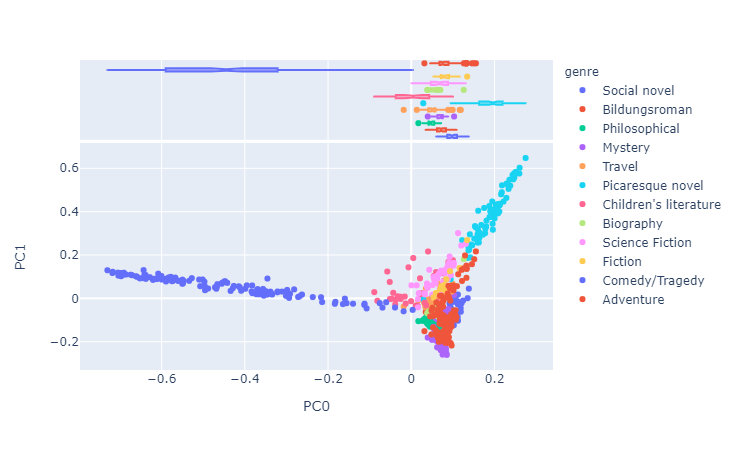

In [51]:
vis_pcs(DCM, 0, 1)

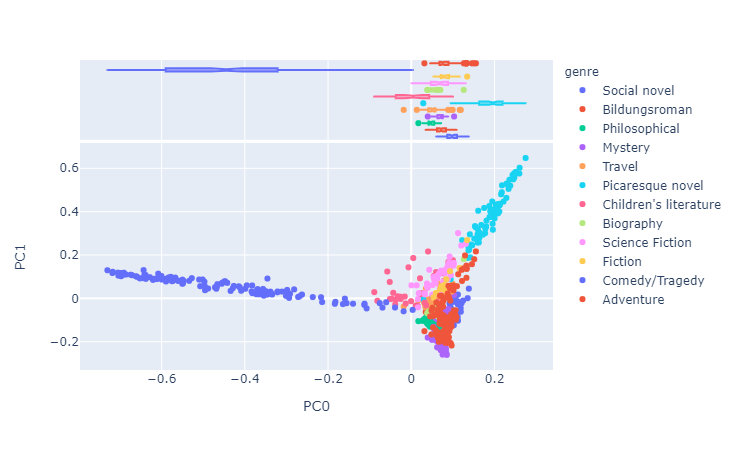

In [52]:
vis_pcs(DCM, 0, 1)

A wide v-shaped scatter plot stemming approximately from the origin (0, 0). The two legs are mainly composed of Mark Twain and Miguel de Cervantes Saavedra. With the two legs removed, the scatter plot doesn't immeidately reveal any noticeable pattern between genres. But if more carefully studied, one can suggest the lighter genres such as adventure, science fiction, and child's literature are located on the top. On the other hand, the relatively more serious genre such as mystery, social, philosophical novels are grouped together near the bottom of the plot.

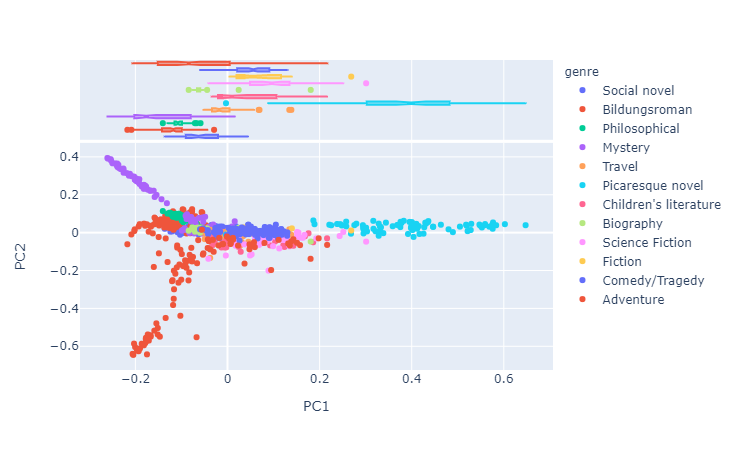

In [53]:
vis_pcs(DCM, 1, 2)

This scatter plot now had 3 legs, mystery, advenutre, and picaresque, also stemming from the origin. It's interesting to note that Comedy/Tragedy, which is seemingly the most different genre in this collection, is now a part of the main cluster. Considering the adventure and picaresque novels are extremly similar genre, it's also interesting how the scatter plot was successful in separating these two.

In [54]:
def vis_pcs2(M, a, b, prefix='PC'):
    fig = px.scatter(M, prefix + str(a), prefix + str(b), 
                        color='author', 
                        hover_name='genre', marginal_x='box')
    fig.show()

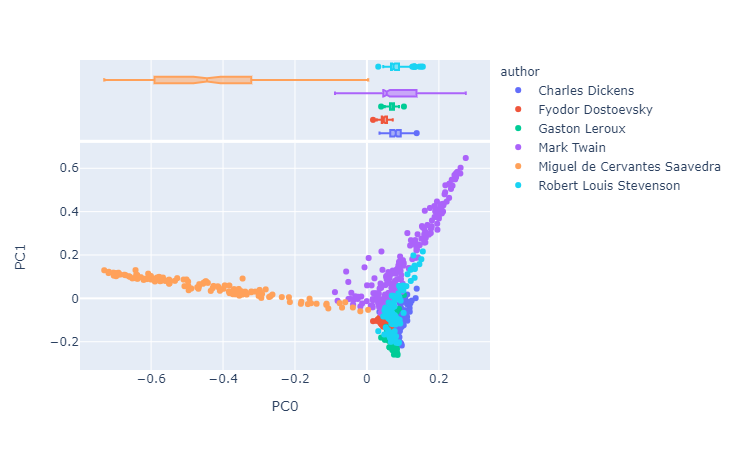

In [55]:
vis_pcs2(DCM, 0, 1)

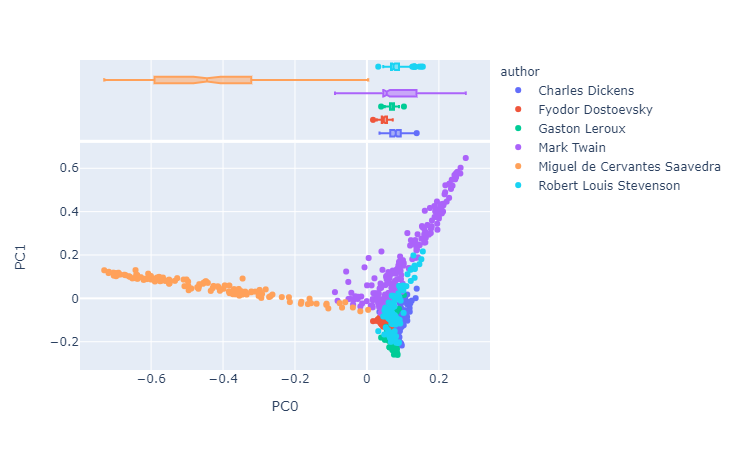

In [56]:
vis_pcs2(DCM, 0, 1)

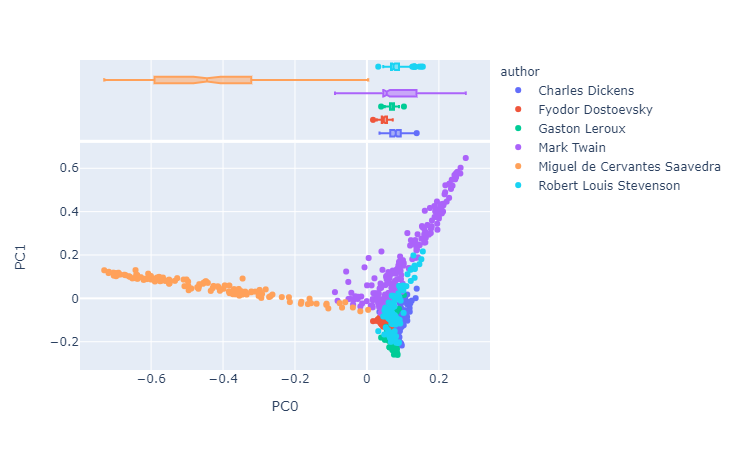

In [57]:
vis_pcs2(DCM, 0, 1)

The two English writers, Charles Dickens and Rober Louis Stevenson, are grouped together as well.
The non-English works of Dostoevsky and Leroux but Cervantes are located in the main cluster. 

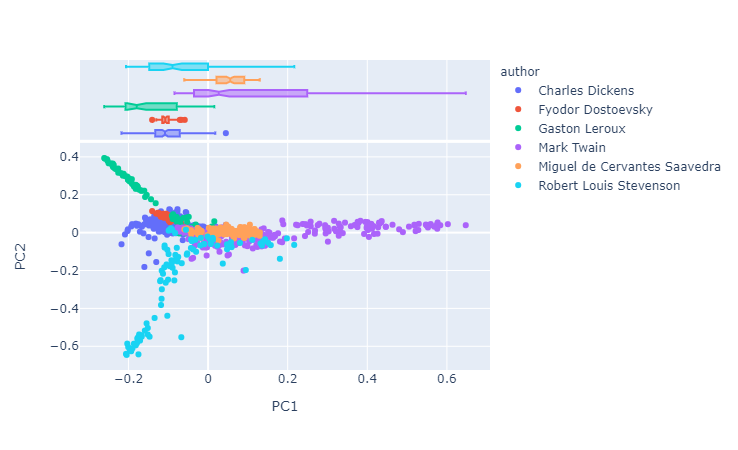

In [58]:
vis_pcs2(DCM, 1, 2)

In [59]:
def vis_pcs3(M, a, b, prefix='PC'):
    fig = px.scatter(M, prefix + str(a), prefix + str(b), 
                        color='year', 
                        hover_name='book', marginal_x='box')
    fig.show()

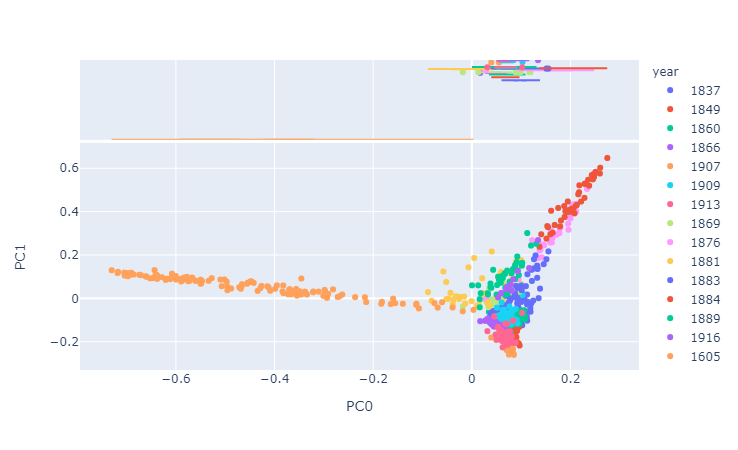

In [60]:
vis_pcs3(DCM, 0, 1)

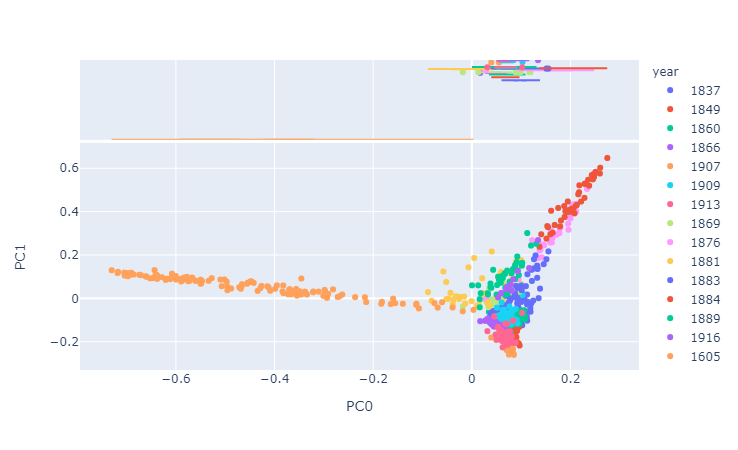

In [61]:
vis_pcs3(DCM, 0, 1)

Comedy/Tragedy written in 1605 has as wide span from 0 to 0.7 by itself.
No other notable pattern.

### 4.1.6. Scikit Learn

In [62]:
pca_engine = PCA(n_components=10)

In [63]:
DCM_sk = pd.DataFrame(pca_engine.fit_transform(TFIDF_REDUCED), index=TFIDF_REDUCED.index)
DCM_sk.columns = ['PC{}'.format(i) for i in DCM_sk.columns]

DCM_sk = DCM_sk.merge(LIB, how='left', left_on='book', right_on='book')

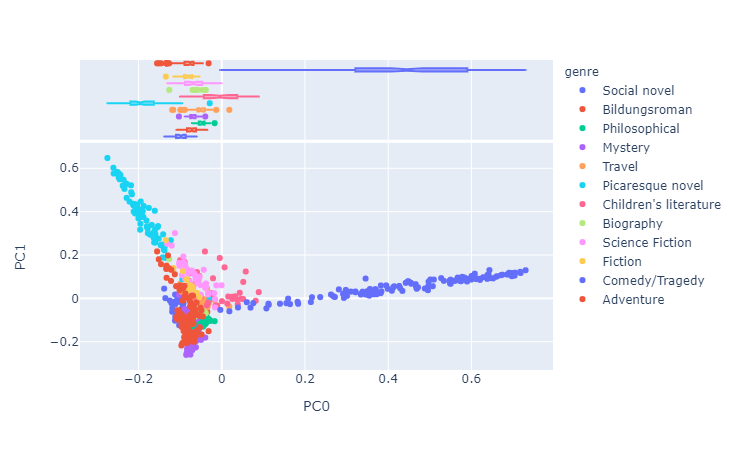

In [64]:
vis_pcs(DCM_sk, 0, 1)

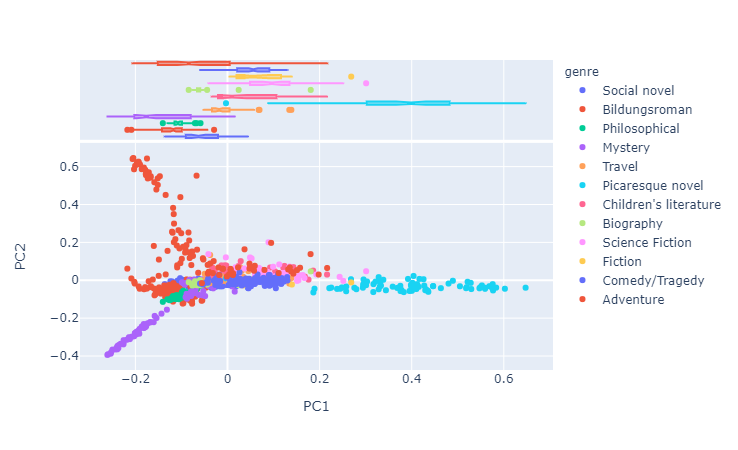

In [65]:
vis_pcs(DCM_sk, 1, 2)

In [66]:
px.scatter_3d(DCM_sk, 'PC0', 'PC1','PC2', color='book', hover_name='author', height=1000, width=1200)

In [67]:
px.scatter_3d(DCM_sk, 'PC0', 'PC1','PC2', color='author', hover_name='book', height=1000, width=1200)

The 3d scatter plot with scikit learn again shows a four-way segments. This is extremely interesiting becuase now the segments can be clearly distinguished by their cultural backgrounds. To the right (green and yellow, positive PC1) is the American writer Mark Twain. To the left (orange, positive PC0) is the Spanish writer Cervantes. The upper leg (pink and red, positive PC2) is composed of Charles Dickens and Robert Louis Stevenson. The last one with all negative PC0, PC1, and PC2 values is Fyodor Dostoyevsky and Gaston Leroux, from Russia and France, respectively.

We can see that the two iconic novels by Mark Twain, The Adventures of Tom Sawyer (yellow) and Adventures of Huckleberry Finn (green) are almost identical to each other, located.

## Save Progress
End of Phase 4.1

In [68]:
DCM.to_csv('PCA_DCM.csv')
TOPS.to_csv('PCA_TCM.csv')
LOADINGS.to_csv('LOADINGS.csv')

In [ ]:
DOC.to_csv('DOC4_1.csv')
LIB.to_csv('LIB4_1.csv')
VOCAB.to_csv('VOCAB4_1.csv')
TOKEN.to_csv('TOKEN4_1.csv')

## 4.2. Topic Models (LDA)

### 4.2.1. Configs

In [69]:
n_terms = 4000
n_topics = 30
max_iter = 5
src_corpus =  'novels-TOKEN.csv'

In [70]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation as LDA

In [71]:
OHCO_PARAS = ['book_id', 'chap_num','para_num']
OHCO_BOOKS = ['book_id']

In [72]:
def getTopics(OHCO_level, TOKEN):
    if OHCO_level == 'paras':
        OHCO = ['book_id', 'chap_num','para_num']
        a = 'para_str'
    if OHCO_level == 'books':
        OHCO = ['book_id']
        a = 'book_str'
    
    df = TOKEN[TOKEN.pos.str.match(r'^NNS?$')]\
        .groupby(OHCO).term_str\
        .apply(lambda x: ' '.join(x))\
        .to_frame()\
        .rename(columns={'term_str':a})
    
    tfv = CountVectorizer(max_features=n_terms, stop_words='english')
    tf = tfv.fit_transform(df[a])
    TERMS = tfv.get_feature_names()
    
    lda = LDA(n_components=n_topics, max_iter=max_iter, learning_offset=50., random_state=0)
    
    THETA = pd.DataFrame(lda.fit_transform(tf), index=df.index)
    THETA.columns.name = 'topic_id'
    
    PHI = pd.DataFrame(lda.components_, columns=TERMS)
    PHI.index.name = 'topic_id'
    PHI.columns.name  = 'term_str'
    
    TOPICS = PHI.stack().to_frame().rename(columns={0:'weight'})\
    .groupby('topic_id')\
    .apply(lambda x: 
           x.weight.sort_values(ascending=False)\
               .head(10)\
               .reset_index()\
               .drop('topic_id',1)\
               .term_str)
    
    TOPICS['label'] = TOPICS.apply(lambda x: str(x.name) + ' ' + ' '.join(x), 1)
    
    TOPICS['doc_weight_sum'] = THETA.sum()
    
    topic_cols = [t for t in range(n_topics)]
    AUTHORS = THETA.join(LIB, on='book_id')\
        .reset_index().set_index(['author']+OHCO)\
        .groupby('author')[topic_cols].mean()\
        .T                                            
    AUTHORS.index.name = 'topic_id'
    AUTHORS['topterms'] = TOPICS[[i for i in range(10)]].apply(lambda x: ' '.join(x), 1)
    
    return AUTHORS, THETA, PHI, TOPICS

In [73]:
AUTHORS_PARAS, THETA_PARAS, PHI_PARAS, TOPICS_PARAS = getTopics('paras', TOKEN)

In [74]:
AUTHORS_BOOKS, THETA_BOOKS, PHI_BOOKS, TOPICS_BOOKS = getTopics('books', TOKEN)

### 4.2.2. Heat Maps

In [75]:
AUTHORS_PARAS.sort_values('Mark Twain', ascending=False).style.background_gradient()

author,Charles Dickens,Fyodor Dostoevsky,Gaston Leroux,Mark Twain,Miguel de Cervantes Saavedra,Robert Louis Stevenson,topterms
topic_id,,,,,,,
2,0.020604,0.0193121,0.0211338,0.065764,0.0231633,0.0242219,time people night town men things day way horses country
20,0.0214321,0.0144051,0.0255356,0.0596281,0.0158629,0.0411634,river boat house water night time pilot way watch day
22,0.0279636,0.0246086,0.0248425,0.0552945,0.0214362,0.0259323,place years home case dear boys things city land time
18,0.0236887,0.0228474,0.0188187,0.0529714,0.0206307,0.0892508,ye gentleman right man water minute horse bit miles mile
21,0.0331447,0.0490374,0.0362999,0.0400926,0.0267099,0.0384996,man business time thing people person life crime way hand
25,0.0241676,0.0372264,0.0274084,0.0387899,0.014887,0.0291653,money time somebody dollars place note bar pause way wood
17,0.0140112,0.0178758,0.0227268,0.037774,0.167907,0.0222927,thee thou world knight knights art errant murderer time squire
8,0.0436139,0.0429697,0.0308328,0.0348823,0.0221996,0.0347612,girl word anybody doctor lad soul child way mind boy
0,0.0259335,0.0257972,0.0296311,0.0345081,0.0200308,0.0482501,night day hours morning trees town clock sun time moment


In [76]:
AUTHORS_BOOKS.sort_values('Mark Twain', ascending=False).style.background_gradient()

author,Charles Dickens,Fyodor Dostoevsky,Gaston Leroux,Mark Twain,Miguel de Cervantes Saavedra,Robert Louis Stevenson,topterms
topic_id,,,,,,,
7,0.00093629,0.00705817,0.220496,0.497714,5.72718e-07,0.000410265,time man day thing way people men place years night
2,1.13835e-06,1.24017e-06,2.79453e-06,0.134559,5.72718e-07,4.34771e-06,time way boys boy night place thing man day war
23,0.119393,1.24017e-06,0.208454,0.100314,5.72718e-07,0.080493,man boy door time murderer night face eyes gentleman moment
9,1.13835e-06,1.24017e-06,2.79453e-06,0.0882475,5.72718e-07,4.34771e-06,war way time man king nigger duke river kind thing
20,1.13835e-06,1.24017e-06,2.79453e-06,0.0846009,5.72718e-07,4.34771e-06,river boat water time pilot man miles way years day
28,0.874846,0.139599,0.086388,0.049217,2.96988e-05,0.0844425,time hand man head way aunt night face house room
17,1.13835e-06,1.24017e-06,0.00695998,0.0285742,0.999954,0.00419053,time master thou worship way thee man world life knight
21,0.00350688,0.853309,0.103858,0.00930004,5.72718e-07,0.0981136,man time room day door way face eyes moment woman
13,0.0012893,1.24017e-06,2.79453e-06,0.00741611,5.72718e-07,0.729903,man ye time men hand house captain way face sea


In [77]:
AUTHORS_BOOKS.sort_values('Robert Louis Stevenson', ascending=False).style.background_gradient()

author,Charles Dickens,Fyodor Dostoevsky,Gaston Leroux,Mark Twain,Miguel de Cervantes Saavedra,Robert Louis Stevenson,topterms
topic_id,,,,,,,
13,0.0012893,1.24017e-06,2.79453e-06,0.00741611,5.72718e-07,0.729903,man ye time men hand house captain way face sea
21,0.00350688,0.853309,0.103858,0.00930004,5.72718e-07,0.0981136,man time room day door way face eyes moment woman
28,0.874846,0.139599,0.086388,0.049217,2.96988e-05,0.0844425,time hand man head way aunt night face house room
23,0.119393,1.24017e-06,0.208454,0.100314,5.72718e-07,0.080493,man boy door time murderer night face eyes gentleman moment
17,1.13835e-06,1.24017e-06,0.00695998,0.0285742,0.999954,0.00419053,time master thou worship way thee man world life knight
12,1.13835e-06,1.24017e-06,0.373778,2.74416e-06,5.72718e-07,0.00234736,room voice door time ghost eyes man evening chamber night
7,0.00093629,0.00705817,0.220496,0.497714,5.72718e-07,0.000410265,time man day thing way people men place years night
20,1.13835e-06,1.24017e-06,2.79453e-06,0.0846009,5.72718e-07,4.34771e-06,river boat water time pilot man miles way years day
2,1.13835e-06,1.24017e-06,2.79453e-06,0.134559,5.72718e-07,4.34771e-06,time way boys boy night place thing man day war


In [78]:
AUTHORS_BOOKS.sort_values('Gaston Leroux', ascending=False).style.background_gradient()

author,Charles Dickens,Fyodor Dostoevsky,Gaston Leroux,Mark Twain,Miguel de Cervantes Saavedra,Robert Louis Stevenson,topterms
topic_id,,,,,,,
12,1.13835e-06,1.24017e-06,0.373778,2.74416e-06,5.72718e-07,0.00234736,room voice door time ghost eyes man evening chamber night
7,0.00093629,0.00705817,0.220496,0.497714,5.72718e-07,0.000410265,time man day thing way people men place years night
23,0.119393,1.24017e-06,0.208454,0.100314,5.72718e-07,0.080493,man boy door time murderer night face eyes gentleman moment
21,0.00350688,0.853309,0.103858,0.00930004,5.72718e-07,0.0981136,man time room day door way face eyes moment woman
28,0.874846,0.139599,0.086388,0.049217,2.96988e-05,0.0844425,time hand man head way aunt night face house room
17,1.13835e-06,1.24017e-06,0.00695998,0.0285742,0.999954,0.00419053,time master thou worship way thee man world life knight
13,0.0012893,1.24017e-06,2.79453e-06,0.00741611,5.72718e-07,0.729903,man ye time men hand house captain way face sea
2,1.13835e-06,1.24017e-06,2.79453e-06,0.134559,5.72718e-07,4.34771e-06,time way boys boy night place thing man day war
9,1.13835e-06,1.24017e-06,2.79453e-06,0.0882475,5.72718e-07,4.34771e-06,war way time man king nigger duke river kind thing


In [79]:
AUTHORS_BOOKS.sort_values('Charles Dickens', ascending=False).style.background_gradient()

author,Charles Dickens,Fyodor Dostoevsky,Gaston Leroux,Mark Twain,Miguel de Cervantes Saavedra,Robert Louis Stevenson,topterms
topic_id,,,,,,,
28,0.874846,0.139599,0.086388,0.049217,2.96988e-05,0.0844425,time hand man head way aunt night face house room
23,0.119393,1.24017e-06,0.208454,0.100314,5.72718e-07,0.080493,man boy door time murderer night face eyes gentleman moment
21,0.00350688,0.853309,0.103858,0.00930004,5.72718e-07,0.0981136,man time room day door way face eyes moment woman
13,0.0012893,1.24017e-06,2.79453e-06,0.00741611,5.72718e-07,0.729903,man ye time men hand house captain way face sea
7,0.00093629,0.00705817,0.220496,0.497714,5.72718e-07,0.000410265,time man day thing way people men place years night
20,1.13835e-06,1.24017e-06,2.79453e-06,0.0846009,5.72718e-07,4.34771e-06,river boat water time pilot man miles way years day
9,1.13835e-06,1.24017e-06,2.79453e-06,0.0882475,5.72718e-07,4.34771e-06,war way time man king nigger duke river kind thing
17,1.13835e-06,1.24017e-06,0.00695998,0.0285742,0.999954,0.00419053,time master thou worship way thee man world life knight
2,1.13835e-06,1.24017e-06,2.79453e-06,0.134559,5.72718e-07,4.34771e-06,time way boys boy night place thing man day war


### 4.2.3. Top Terms for Each Author

In [80]:
authors = LIB.author.unique().tolist()

In [81]:
# topterms for each author with OHCO Level: Paragraph
for author in authors:
    topterms = AUTHORS_PARAS['topterms'].iloc[AUTHORS_PARAS[author].idxmax()]
    print('{}: {}'.format(author, topterms))

Charles Dickens: door room moment table hand floor chair face light bed
Fyodor Dostoevsky: door room moment table hand floor chair face light bed
Gaston Leroux: door room moment table hand floor chair face light bed
Mark Twain: time people night town men things day way horses country
Miguel de Cervantes Saavedra: thee thou world knight knights art errant murderer time squire
Robert Louis Stevenson: ye gentleman right man water minute horse bit miles mile


In [82]:
# topterms for each author with OHCO Level: Book
for author in authors:
    topterms = AUTHORS_BOOKS['topterms'].iloc[AUTHORS_BOOKS[author].idxmax()]
    print('{}: {}'.format(author, topterms))

Charles Dickens: time hand man head way aunt night face house room
Fyodor Dostoevsky: man time room day door way face eyes moment woman
Gaston Leroux: room voice door time ghost eyes man evening chamber night
Mark Twain: time man day thing way people men place years night
Miguel de Cervantes Saavedra: time master thou worship way thee man world life knight
Robert Louis Stevenson: man ye time men hand house captain way face sea


### 4.2.4. Visualization (Scatter Plot)

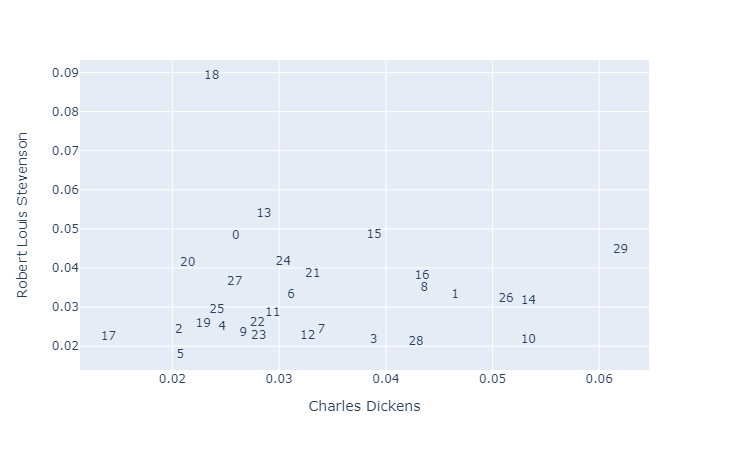

In [85]:
px.scatter(AUTHORS_PARAS.reset_index(), 'Charles Dickens', 'Robert Louis Stevenson', hover_name='topterms', text='topic_id')\
    .update_traces(mode='text')

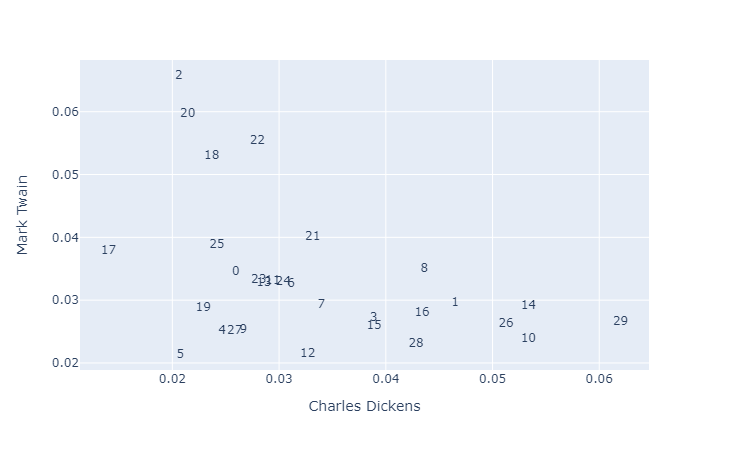

In [86]:
px.scatter(AUTHORS_PARAS.reset_index(), 'Charles Dickens', 'Mark Twain', hover_name='topterms', text='topic_id')\
    .update_traces(mode='text')

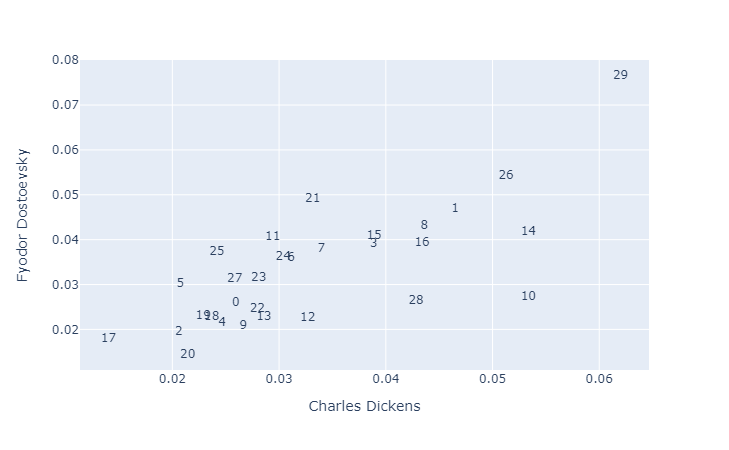

In [84]:
px.scatter(AUTHORS_PARAS.reset_index(), 'Charles Dickens', 'Fyodor Dostoevsky', hover_name='topterms', text='topic_id')\
    .update_traces(mode='text')

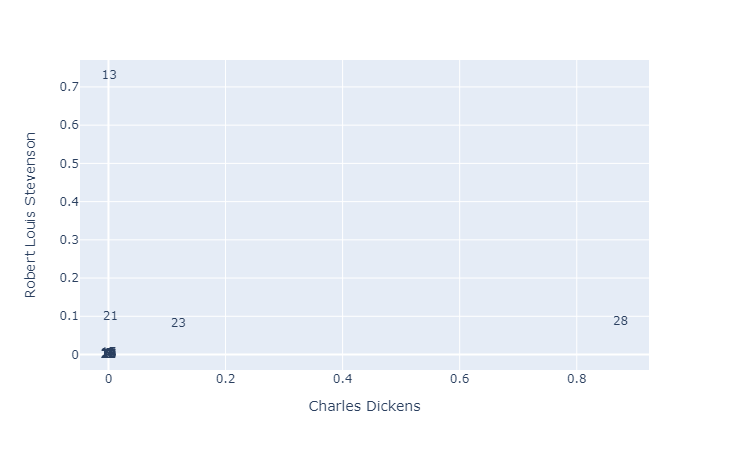

In [91]:
px.scatter(AUTHORS_BOOKS.reset_index(), 'Charles Dickens', 'Robert Louis Stevenson', hover_name='topterms', text='topic_id')\
    .update_traces(mode='text')

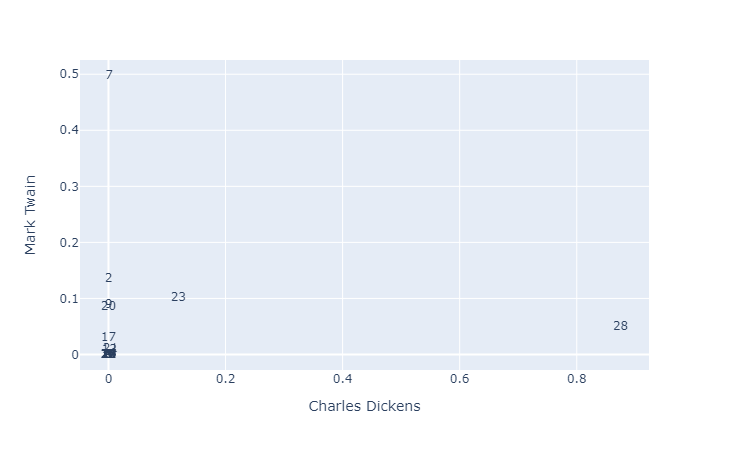

In [92]:
px.scatter(AUTHORS_BOOKS.reset_index(), 'Charles Dickens', 'Mark Twain', hover_name='topterms', text='topic_id')\
    .update_traces(mode='text')

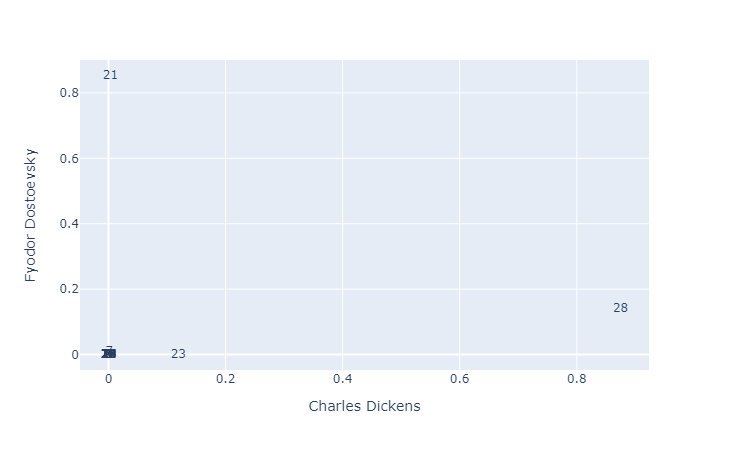

In [94]:
px.scatter(AUTHORS_BOOKS.reset_index(), 'Charles Dickens', 'Fyodor Dostoevsky', hover_name='topterms', text='topic_id')\
    .update_traces(mode='text')

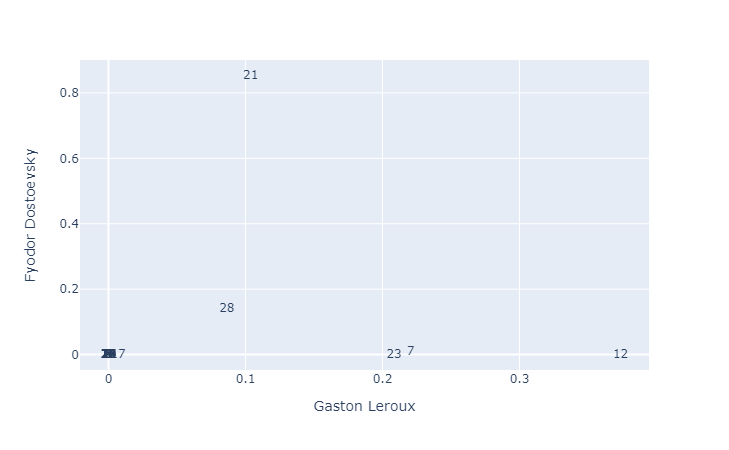

In [89]:
px.scatter(AUTHORS_BOOKS.reset_index(), 'Gaston Leroux', 'Fyodor Dostoevsky', hover_name='topterms', text='topic_id')\
    .update_traces(mode='text')

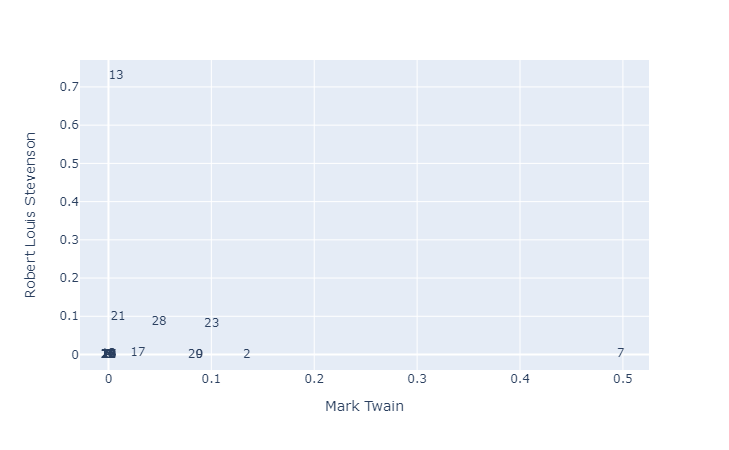

In [90]:
px.scatter(AUTHORS_BOOKS.reset_index(), 'Mark Twain', 'Robert Louis Stevenson', hover_name='topterms', text='topic_id')\
    .update_traces(mode='text')

## Save Progress
End of Phase 4.2

In [95]:
AUTHORS_PARAS.to_csv('AUTHORS_PARAS.csv')
THETA_PARAS.to_csv('THETA_PARAS.csv')
PHI_PARAS.to_csv('PHI_PARAS.csv')
TOPICS_PARAS.to_csv('TOPICS_PARAS.csv')

AUTHORS_BOOKS.to_csv('AUTHORS_BOOKS.csv')
THETA_BOOKS.to_csv('THETA_BOOKS.csv')
PHI_BOOKS.to_csv('PHI_BOOKS.csv')
TOPICS_BOOKS.to_csv('TOPICS_BOOKS.csv')

## 4.3. Word Embeddings (word2vec)

### 4.3.1. Configs

In [99]:
# OHCO = ['genre', 'author', 'book', 'chapter', 'para_num', 'sent_num', 'token_num']
BAG = OHCO[:4] # Paragraphs
# BAG = OHCO[:5] # Sentences

In [96]:
from gensim.models import word2vec
from sklearn.manifold import TSNE

In [100]:
corpus = TOKEN[~TOKEN.pos.str.match('NNPS?')]\
    .groupby(BAG)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

In [101]:
# Generate word embeddings with Gensim's library
model = word2vec.Word2Vec(corpus, size=246, window=5, min_count=200, workers=4)

# Visualize with tSNE
coords = pd.DataFrame(index=range(len(model.wv.vocab)))
coords['label'] = [w for w in model.wv.vocab]
coords['vector'] = coords['label'].apply(lambda x: model.wv.get_vector(x))

tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
tsne_values = tsne_model.fit_transform(coords['vector'].tolist())

coords['x'] = tsne_values[:,0]
coords['y'] = tsne_values[:,1]

In [141]:
coords.head()

,label,vector,x,y
0,of,"[0.0042964616, -0.31854704, 0.18534124, 0.4503...",-0.953025,-14.597865
1,among,"[-0.3563363, -0.73459095, 0.29487425, -0.16965...",-13.043468,9.281518
2,other,"[0.16875291, 0.27809727, 1.5330406, 0.22250791...",-12.537961,-16.368067
3,public,"[-0.13508332, 0.0936286, 0.3263314, -0.1086262...",-7.223006,-7.963146
4,in,"[0.31246114, 0.22446114, -0.27282187, -0.06385...",-2.461557,-16.837967


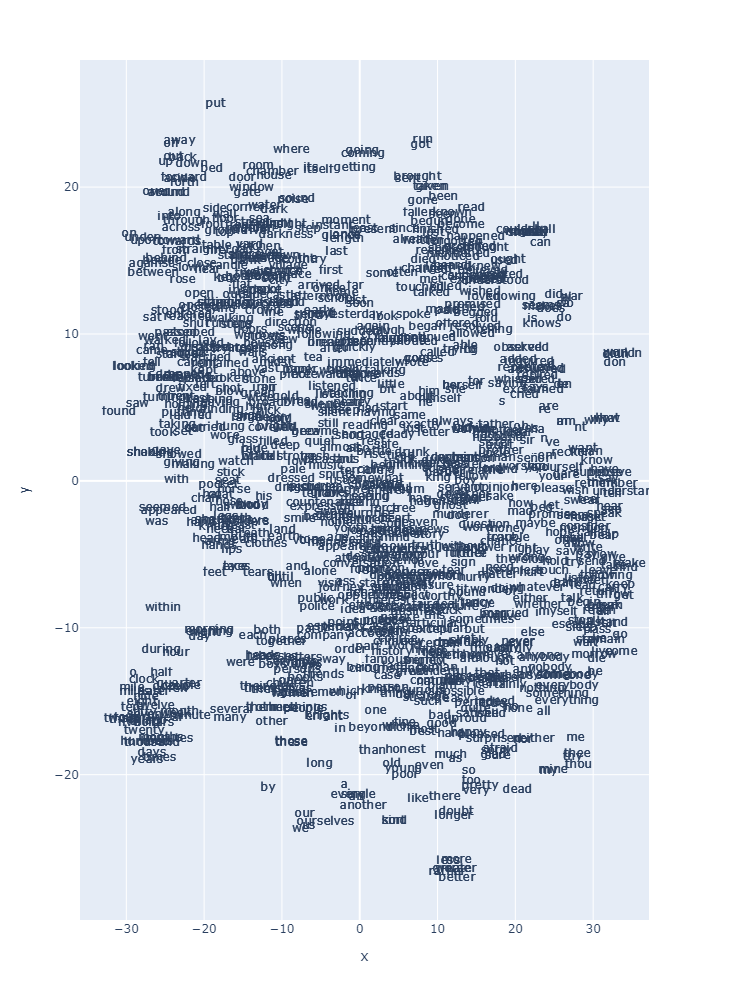

In [102]:
px.scatter(coords, 'x', 'y', text='label', height=1000).update_traces(mode='text')

There are many word clusters in this corpus but only a few noteworthy ones, excluding numbers, body parts, family members, etc. The one I found interesting was a set of locations: shore, hill, bank, inn, boat, road, kitchen, church, village, court, city, town, street, etc. Another cluster that seem important includes more conceptual words such as confidence, thoughts, memory, life, duty, honour, peace, soul, heart, pain, satisfiaction, etc. This cluster seems to be composed of both positive and negative words, such as danger, power, evil, pleasure, pity, love, etc. What I didn't expect in this cluster was the word "family," which is usually associated with other family member terms. This made me think that this cluster could be heavily associated with the central motifs of the novels.

## Save Progress
End of Phase 4.3

In [142]:
coords.to_csv('coords.csv')

## 4.4. Sentiment Analysis

### 4.4.1. Configs

In [150]:
from IPython.core.display import display, HTML
nrc_cols = "nrc_negative nrc_positive nrc_anger nrc_anticipation nrc_disgust nrc_fear nrc_joy nrc_sadness nrc_surprise nrc_trust".split()
emo = 'polarity'

In [153]:
# get lexicon
salex = pd.read_csv('salex_nrc.csv').set_index('term_str')
salex.columns = [col.replace('nrc_','') for col in salex.columns]
salex['polarity'] = salex.positive - salex.negative

# get lexicon columns
emo_cols = "anger anticipation disgust fear joy sadness surprise trust polarity".split()

In [149]:
SA_TOKEN = TOKEN.reset_index().set_index(['author', 'book', 'chap_num', 'para_num', 'sent_num'])
SA_TOKEN.head()

year  token_num  \
author          book              chap_num para_num sent_num                    
Charles Dickens David Copperfield 1        1        0         1849          0   
                                                    0         1849          1   
                                                    0         1849          2   
                                                    0         1849          3   
                                                    0         1849          4   

                                                              book_id  \
author          book              chap_num para_num sent_num            
Charles Dickens David Copperfield 1        1        0             766   
                                                    0             766   
                                                    0             766   
                                                    0             766   
                                                    0             766   

                                                                  pos_tuple  \
author          book              chap_num para_num sent_num                  
Charles Dickens David Copperfield 1        1        0         (Whether, IN)   
                                                    0              (I, PRP)   
                                                    0           (shall, MD)   
                                                    0            (turn, VB)   
                                                    0             (out, RP)   

                                                              pos token_str  \
author          book              chap_num para_num sent_num                  
Charles Dickens David Copperfield 1        1        0          IN   Whether   
                                                    0         PRP         I   
                                                    0          MD     shall   
                                                    0          VB      turn   
                                                    0          RP       out   

                                                             term_str  \
author          book              chap_num para_num sent_num            
Charles Dickens David Copperfield 1        1        0         whether   
                                                    0               i   
                                                    0           shall   
                                                    0            turn   
                                                    0             out   

                                                              term_id  \
author          book              chap_num para_num sent_num            
Charles Dickens David Copperfield 1        1        0           38470   
                                                    0           17423   
                                                    0           31016   
                                                    0           36019   
                                                    0           24218   

                                                                      genre  \
author          book              chap_num para_num sent_num                  
Charles Dickens David Copperfield 1        1        0         Bildungsroman   
                                                    0         Bildungsroman   
                                                    0         Bildungsroman   
                                                    0         Bildungsroman   
                                                    0         Bildungsroman   

                                                                                                      book_file  
author          book              chap_num para_num sent_num                                                     
Charles Dickens David Copperfield 1        1        0         collec

In [156]:
SA_TOKEN = SA_TOKEN.join(salex, on='term_str', how='left')
SA_TOKEN[emo_cols] = SA_TOKEN[emo_cols].fillna(0)

In [157]:
SA_TOKEN[salex.columns].sample(10)

anger  \
author                       book                                      chap_num para_num sent_num          
Charles Dickens              David Copperfield                         5        106      0           0.0   
Miguel de Cervantes Saavedra The History of Don Quixote                31       49       1           0.0   
Mark Twain                   The Innocents Abroad                      31       23       1           0.0   
                             The Mysterious Stranger and Other Stories 11       71       1           0.0   
Miguel de Cervantes Saavedra The History of Don Quixote                108      31       1           0.0   
Charles Dickens              Great Expectations                        25       51       4           0.0   
Mark Twain                   Life On The Mississippi, Complete         60       828      6           0.0   
Gaston Leroux                The Phantom of the Opera                  20       133      0           0.0   
Fyodor Dostoevsky            Crime and Punishment                      14       77       1           0.0   
Miguel de Cervantes Saavedra The History of Don Quixote                108      23       2           0.0   

                                                                                                   anticipation  \
author                       book                                      chap_num para_num sent_num                 
Charles Dickens              David Copperfield                         5        106      0                  0.0   
Miguel de Cervantes Saavedra The History of Don Quixote                31       49       1                  0.0   
Mark Twain                   The Innocents Abroad                      31       23       1                  0.0   
                             The Mysterious Stranger and Other Stories 11       71       1                  0.0   
Miguel de Cervantes Saavedra The History of Don Quixote                108      31       1                  0.0   
Charles Dickens              Great Expectations                        25       51       4                  0.0   
Mark Twain                   Life On The Mississippi, Complete         60       828      6                  0.0   
Gaston Leroux                The Phantom of the Opera                  20       133      0                  0.0   
Fyodor Dostoevsky            Crime and Punishment                      14       77       1                  0.0   
Miguel de Cervantes Saavedra The History of Don Quixote                108      23       2                  0.0   

                                                                                                   disgust  \
author                       book                                      chap_num para_num sent_num            
Charles Dickens              David Copperfield                         5        106      0             0.0   
Miguel de Cervantes Saavedra The History of Don Quixote                31       49       1             0.0   
Mark Twain                   The Innocents Abroad                      31       23       1             0.0   
                             The Mysterious Stranger and Other Stories 11       71       1             0.0   
Miguel de Cervantes Saavedra The History of Don Quixote                108      31       1             0.0   
Charles Dickens              Great Expectations                        25       51       4             0.0   
Mark Twain                   Life On The Mississippi, Complete         60       828      6             0.0   
Gaston Leroux                The Phantom of the Opera                  20       133      0             0.0   
Fyodor Dostoevsky            Crime and Punishment                      14       77       1             0.0   
Miguel de Cervantes Saavedra The History of Don Quixote                108      23       2             0.0   

                                                                                                   f

In [158]:
SA_TOKEN[['term_str'] + emo_cols].sample(10)

term_str  \
author                       book                                      chap_num para_num sent_num            
Mark Twain                   Adventures of Huckleberry Finn, Complete  38       37       1             why   
Fyodor Dostoevsky            Crime and Punishment                      10       111      3            into   
                                                                       39       130      3             she   
Mark Twain                   The Innocents Abroad                      26       5        14           they   
Miguel de Cervantes Saavedra The History of Don Quixote                109      49       0         obscene   
Charles Dickens              Great Expectations                        42       31       1           three   
Fyodor Dostoevsky            Crime and Punishment                      34       12       2           paces   
Charles Dickens              David Copperfield                         50       1        0             our   
Mark Twain                   The Mysterious Stranger and Other Stories 3        14       5          coming   
Charles Dickens              David Copperfield                         36       61       2             for   

                                                                                                   anger  \
author                       book                                      chap_num para_num sent_num          
Mark Twain                   Adventures of Huckleberry Finn, Complete  38       37       1           0.0   
Fyodor Dostoevsky            Crime and Punishment                      10       111      3           0.0   
                                                                       39       130      3           0.0   
Mark Twain                   The Innocents Abroad                      26       5        14          0.0   
Miguel de Cervantes Saavedra The History of Don Quixote                109      49       0           0.0   
Charles Dickens              Great Expectations                        42       31       1           0.0   
Fyodor Dostoevsky            Crime and Punishment                      34       12       2           0.0   
Charles Dickens              David Copperfield                         50       1        0           0.0   
Mark Twain                   The Mysterious Stranger and Other Stories 3        14       5           0.0   
Charles Dickens              David Copperfield                         36       61       2           0.0   

                                                                                                   anticipation  \
author                       book                                      chap_num para_num sent_num                 
Mark Twain                   Adventures of Huckleberry Finn, Complete  38       37       1                  0.0   
Fyodor Dostoevsky            Crime and Punishment                      10       111      3                  0.0   
                                                                       39       130      3                  0.0   
Mark Twain                   The Innocents Abroad                      26       5        14                 0.0   
Miguel de Cervantes Saavedra The History of Don Quixote                109      49       0                  0.0   
Charles Dickens              Great Expectations                        42       31       1                  0.0   
Fyodor Dostoevsky            Crime and Punishment                      34       12       2                  0.0   
Charles Dickens              David Copperfield                         50       1        0                  0.0   
Mark Twain                   The Mysterious Stranger and Other Stories 3        14       5                  0.0   
Charles Dickens              David Copperfield                         36       61       2                  0.0   

                                                                                                   

In [179]:
HUCKFINN = SA_TOKEN.loc[('Mark Twain', 'Adventures of Huckleberry Finn, Complete')]
CRIMEPUNISH = SA_TOKEN.loc[('Fyodor Dostoevsky', 'Crime and Punishment')]
TREASURE = SA_TOKEN.loc[('Robert Louis Stevenson', 'Treasure Island')]
PHANTOM = SA_TOKEN.loc[('Gaston Leroux', 'The Phantom of the Opera')]
DONQUIXOTE = SA_TOKEN.loc[('Miguel de Cervantes Saavedra', 'The History of Don Quixote')]
OLIVER = SA_TOKEN.loc[('Charles Dickens', 'Oliver Twist')]

### 4.4.2. Visualizations

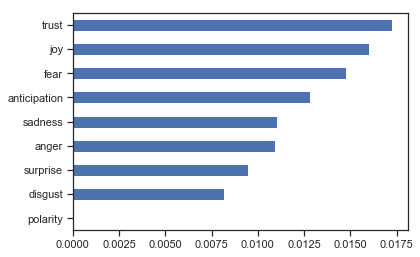

In [180]:
HUCKFINN[emo_cols].mean().sort_values().plot.barh()

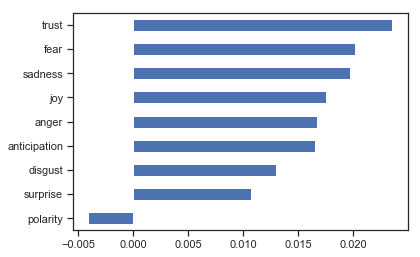

In [181]:
CRIMEPUNISH[emo_cols].mean().sort_values().plot.barh()

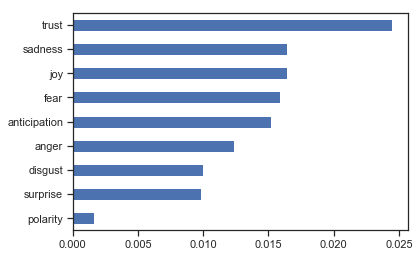

In [196]:
TREASURE[emo_cols].mean().sort_values().plot.barh()

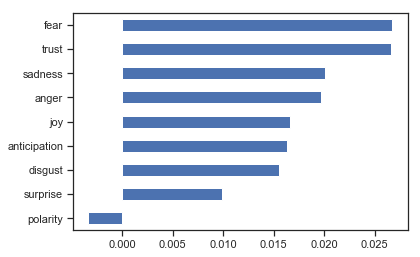

In [198]:
JEKYLL[emo_cols].mean().sort_values().plot.barh()

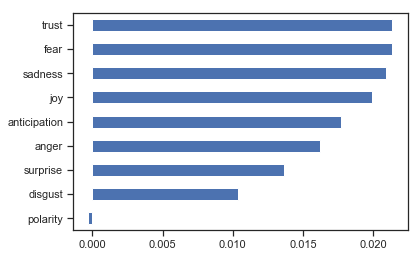

In [197]:
PHANTOM[emo_cols].mean().sort_values().plot.barh()

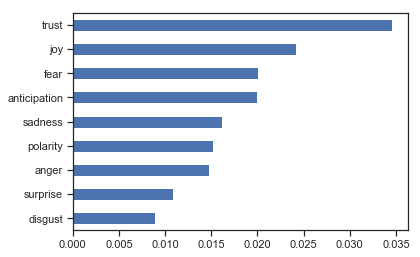

In [211]:
DONQUIXOTE[emo_cols].mean().sort_values().plot.barh()

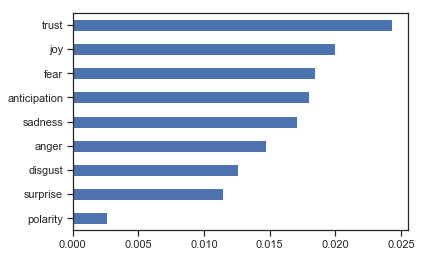

In [212]:
OLIVER[emo_cols].mean().sort_values().plot.barh()

### 4.4.3. Sentiment by Chapter

In [184]:
HUCKFINN_chaps = HUCKFINN.groupby('chap_num')[emo_cols].mean()
CRIMEPUNISH_chaps = CRIMEPUNISH.groupby('chap_num')[emo_cols].mean()
TREASURE_chaps = TREASURE.groupby('chap_num')[emo_cols].mean()
PHANTOM_chaps = PHANTOM.groupby('chap_num')[emo_cols].mean()
DONQUIXOTE_chaps = DONQUIXOTE.groupby('chap_num')[emo_cols].mean()
OLIVER_chaps = OLIVER.groupby('chap_num')[emo_cols].mean()

In [185]:
def plot_sentiments(df, emo='polarity'):
    FIG = dict(figsize=(25, 5), legend=True, fontsize=14, rot=45)
    df[emo].plot(**FIG)

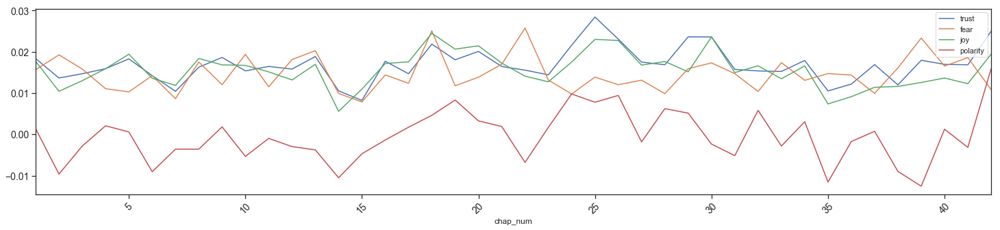

In [186]:
plot_sentiments(HUCKFINN_chaps, ['trust','fear','joy','polarity'])

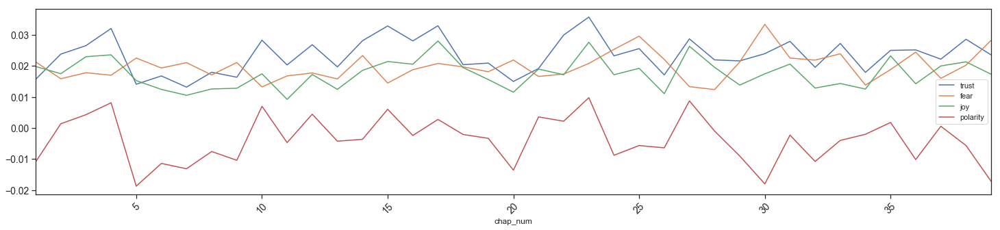

In [188]:
plot_sentiments(CRIMEPUNISH_chaps, ['trust','fear','joy','polarity'])

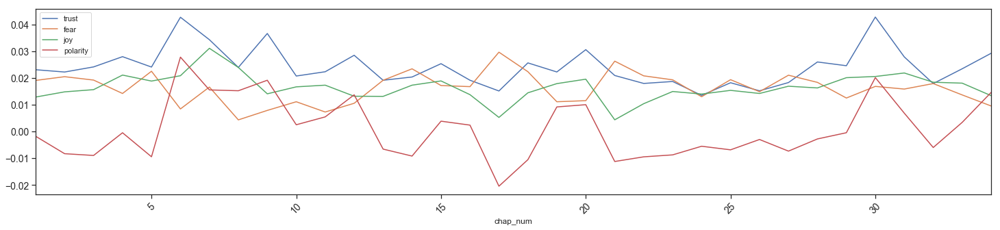

In [202]:
plot_sentiments(TREASURE_chaps, ['trust','fear','joy','polarity'])

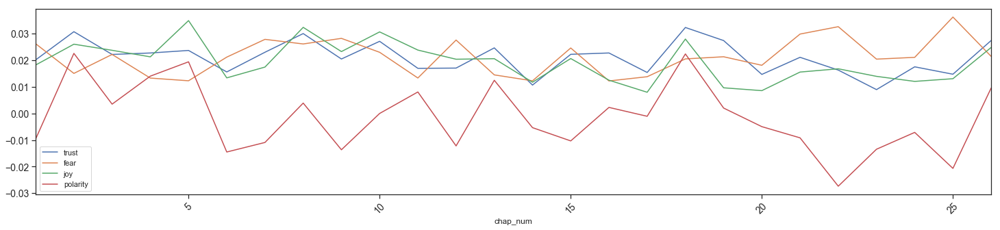

In [206]:
plot_sentiments(PHANTOM_chaps, ['trust','fear','joy','polarity'])

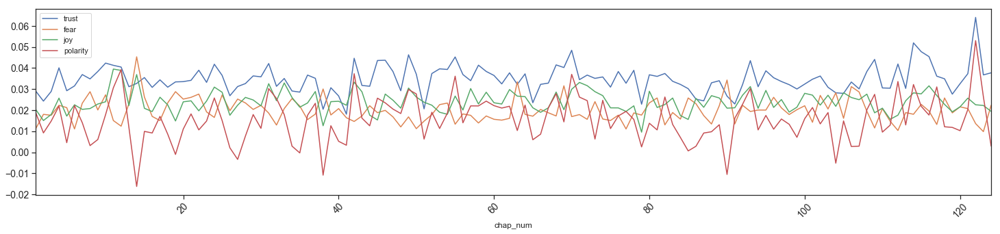

In [214]:
plot_sentiments(DONQUIXOTE_chaps, ['trust','fear','joy','polarity'])

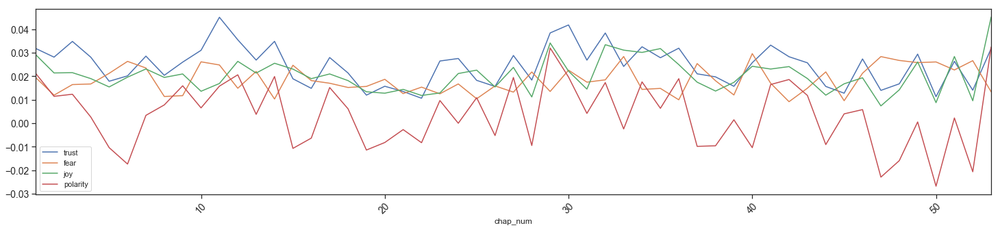

In [215]:
plot_sentiments(OLIVER_chaps, ['trust','fear','joy','polarity'])

### 4.4.4. VADER

In [216]:
HUCKFINN['html'] =  HUCKFINN.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.token_str), 1)
OLIVER['html'] =  OLIVER.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.token_str), 1)

C:\Users\JHL\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\Users\JHL\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [219]:
HUCKFINN_sents = HUCKFINN.groupby('sent_num')[emo_cols].mean()
OLIVER_sents = OLIVER.groupby('sent_num')[emo_cols].mean()

In [220]:
HUCKFINN_sents['sent_str'] = HUCKFINN.groupby('sent_num').term_str.apply(lambda x: x.str.cat(sep=' '))
HUCKFINN_sents['html_str'] = HUCKFINN.groupby('sent_num').html.apply(lambda x: x.str.cat(sep=' '))

OLIVER_sents['sent_str'] = OLIVER.groupby('sent_num').term_str.apply(lambda x: x.str.cat(sep=' '))
OLIVER_sents['html_str'] = OLIVER.groupby('sent_num').html.apply(lambda x: x.str.cat(sep=' '))

In [223]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()

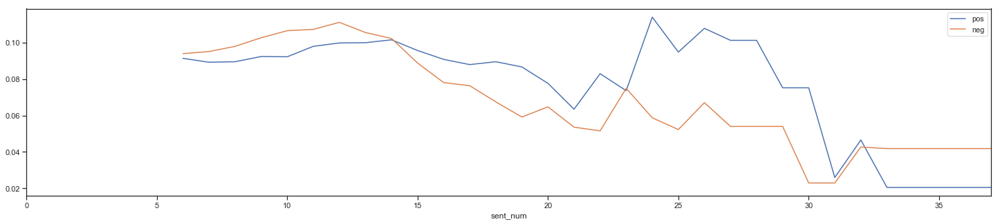

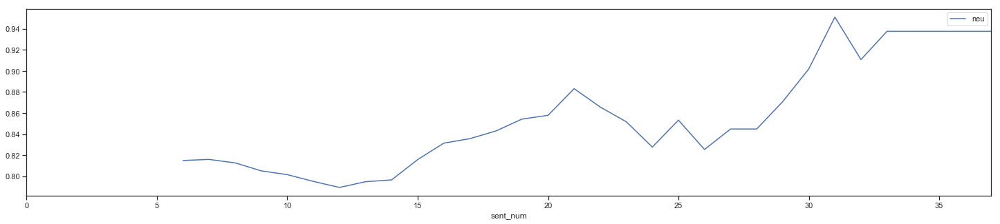

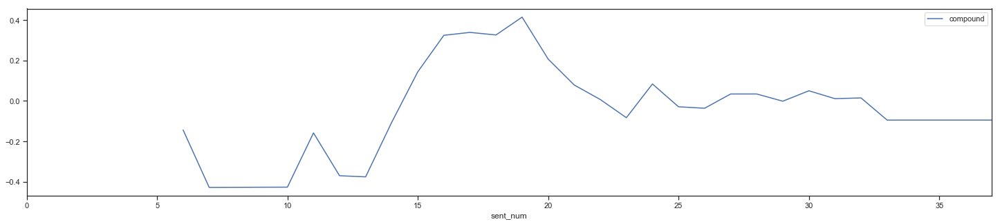

In [224]:
HUCKFINN_vader_cols = HUCKFINN_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
HUCKFINN_vader = pd.concat([HUCKFINN_sents, HUCKFINN_vader_cols], axis=1)

w = int(HUCKFINN_vader.shape[0] / 5)
HUCKFINN_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
HUCKFINN_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
HUCKFINN_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

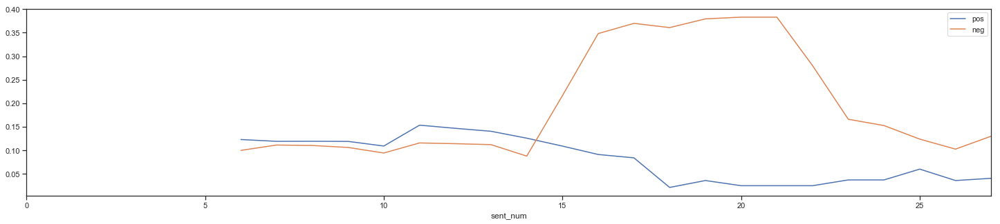

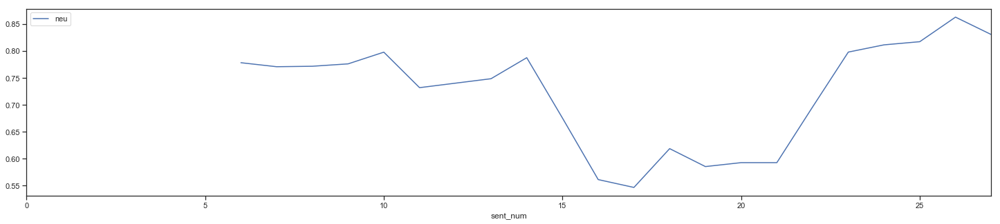

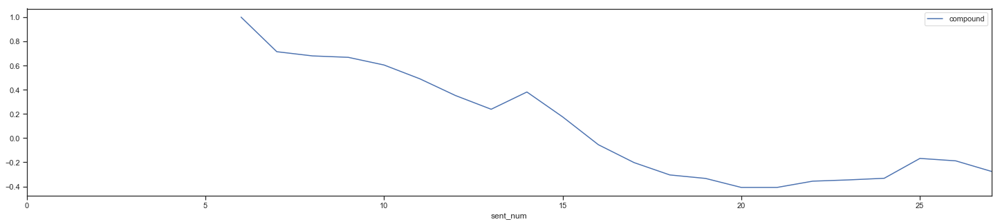

In [226]:
OLIVER_vader_cols = OLIVER_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
OLIVER_vader = pd.concat([OLIVER_sents, OLIVER_vader_cols], axis=1)

w = int(HUCKFINN_vader.shape[0] / 5)
OLIVER_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
OLIVER_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
OLIVER_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

## Save Progress
End of Phase 4.4

In [227]:
HUCKFINN_chaps.to_csv('HUCKFINN_chaps.csv')
CRIMEPUNISH_chaps.to_csv('CRIMEPUNISH_chaps.csv')
TREASURE_chaps.to_csv('TREASURE_chaps.csv')
PHANTOM_chaps.to_csv('PHANTOM_chaps.csv')
DONQUIXOTE_chaps.to_csv('DONQUIXOTE_chaps.csv')
OLIVER_chaps.to_csv('OLIVER_chaps.csv')

HUCKFINN_vader.to_csv('HUCKFINN_vader.csv')
OLIVER_vader.to_csv('OLIVER_vader.csv')

# 5. Explore

Please see each section in **4. Analysis** for more visualizations and interpretations.

## 5.1. Configs

In [245]:
# creating a new (temporary) TFIDF dataframe for clustering purpose only
a = TFIDF.reset_index()

In [246]:
a = a.merge(LIB.book.reset_index(), on='book')
a = a.drop(columns=['author','year','book'])
a.head()

,chap_num,1,2,3,4,5,6,7,8,9,...,39319,39320,39321,39322,39323,39324,39325,39326,39327,book_id
0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,730
1,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,730
2,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,730
3,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,730
4,5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,730


In [249]:
a = a.groupby('book_id').mean()
a.head()

,chap_num,1,2,3,4,5,6,7,8,9,...,39318,39319,39320,39321,39322,39323,39324,39325,39326,39327
book_id,,,,,,,,,,,,,,,,,,,,,
43,3.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
74,18.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
76,21.5,0.0,0.000000,0.000000,0.000013,0.000013,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
86,22.5,0.0,0.000000,0.000000,0.000150,0.000028,0.000045,0.0,0.000025,0.000018,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
120,17.5,0.0,0.000017,0.000017,0.000039,0.000000,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [251]:
DOC_sim = a.reset_index()[['book_id']] # We create a table from the OHCO in our TFIDF table
DOC_sim.head()

,book_id
0,43
1,74
2,76
3,86
4,120


In [252]:
DOC_sim.index.name = 'doc_id'
DOC_sim.head()

,book_id
doc_id,
0,43
1,74
2,76
3,86
4,120


In [254]:
DOC_sim['title'] = DOC_sim.book_id.map(LIB.author) \
    + '-' + DOC_sim[['book_id']].apply(lambda x: x.astype('str').str.cat(sep='-'), 1) \
    + ': '+ DOC_sim.book_id.map(LIB.book) \
    + '-' + DOC_sim.book_id.map(LIB.year.astype('str'))

DOC_sim.head()

,book_id,title
doc_id,,
0,43,Robert Louis Stevenson-43: The Strange Case Of...
1,74,"Mark Twain-74: The Adventures of Tom Sawyer, C..."
2,76,"Mark Twain-76: Adventures of Huckleberry Finn,..."
3,86,Mark Twain-86: A Connecticut Yankee in King Ar...
4,120,Robert Louis Stevenson-120: Treasure Island-1883


In [255]:
L0 = a.astype('bool').astype('int')
L1 = a.apply(lambda x: x / x.sum(), 1)
L2 = a.apply(lambda x: x / norm(x), 1)

In [256]:
PAIRS = pd.DataFrame(index=pd.MultiIndex.from_product([DOC_sim.index.tolist(), DOC_sim.index.tolist()])).reset_index()
PAIRS = PAIRS[PAIRS.level_0 < PAIRS.level_1].set_index(['level_0','level_1'])
PAIRS.index.names = ['doc_a', 'doc_b']

In [257]:
PAIRS.shape

(171, 0)

In [258]:
PAIRS.head()

Empty DataFrame
Columns: []
Index: [(0, 1), (0, 2), (0, 3), (0, 4), (0, 5)]

In [260]:
from numpy.linalg import norm
from scipy.spatial.distance import pdist

In [262]:
PAIRS['cityblock'] = pdist(a, 'cityblock')
PAIRS['euclidean'] = pdist(a, 'euclidean')
PAIRS['cosine'] = pdist(a, 'cosine')
PAIRS['jaccard'] = pdist(L0, 'jaccard') # Fast, and similar to js
PAIRS['dice'] = pdist(L0, 'dice')
PAIRS['js'] = pdist(L1, 'jensenshannon') # Turns out to be really slow
PAIRS['euclidean2'] = pdist(L2, 'euclidean') # Should be the same as cosine (colinear)
PAIRS['cityblock'] = pdist(a, 'minkowski', p=2)

In [263]:
PAIRS.head()

cityblock  euclidean    cosine   jaccard      dice        js  \
doc_a doc_b                                                                 
0     1      15.000026  15.000026  0.000034  0.748076  0.597541  0.198846   
      2      18.500020  18.500020  0.000034  0.791061  0.654343  0.202314   
      3      19.500016  19.500016  0.000034  0.773148  0.630188  0.198303   
      4      14.500023  14.500023  0.000033  0.719975  0.562469  0.196580   
      5      10.500041  10.500041  0.000034  0.722738  0.565849  0.198340   

             euclidean2  
doc_a doc_b              
0     1        0.008214  
      2        0.008213  
      3        0.008195  
      4        0.008179  
      5        0.008258

## 5.2. Distributions

In [264]:
if PAIRS.shape[0] > 1000:
    SAMPLE = PAIRS.sample(1000)
else:
    SAMPLE = PAIRS

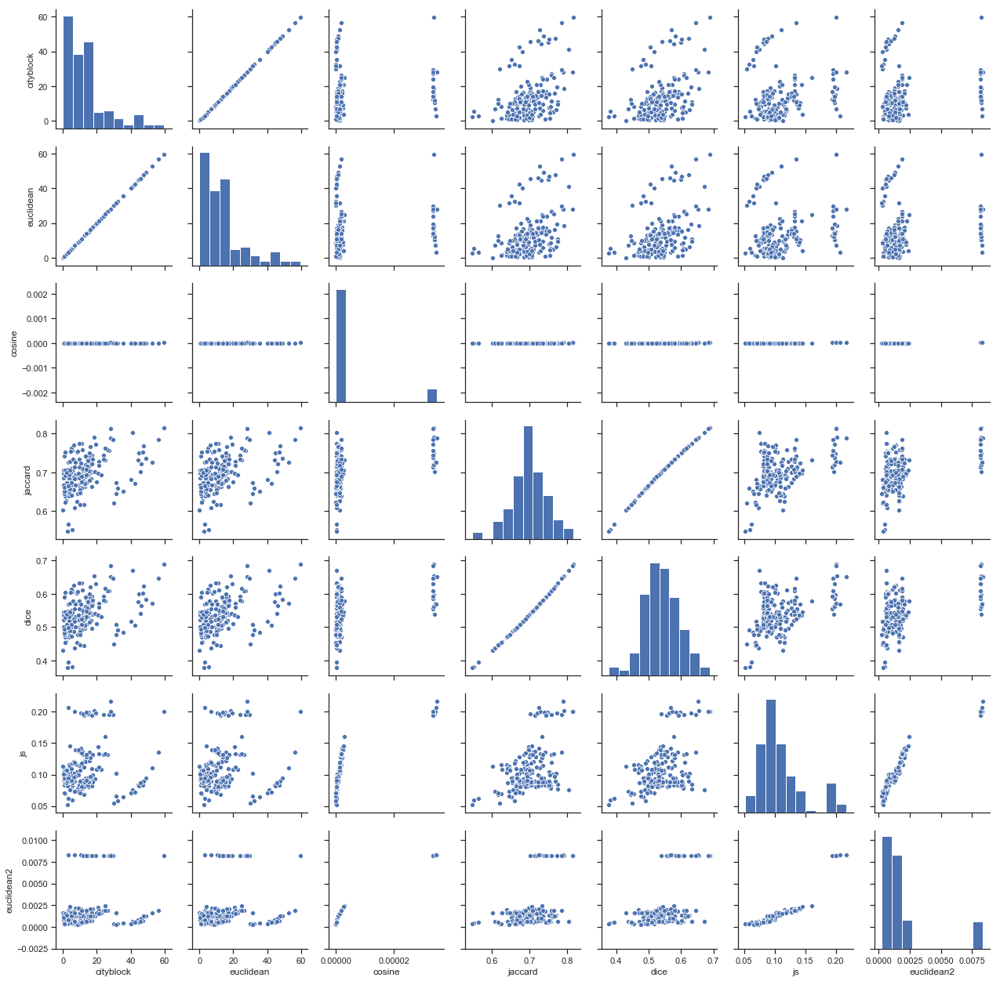

In [265]:
sns.pairplot(SAMPLE)

In [266]:
PAIRS.sort_values('cosine').head(20).style.background_gradient('YlGn')

,,cityblock,euclidean,cosine,jaccard,dice,js,euclidean2
doc_a,doc_b,,,,,,,
11,17,31.5,31.5,2.94533e-08,0.645477,0.476534,0.0663295,0.000242707
3,17,8.5,8.5,4.4683e-08,0.6459,0.476996,0.0737927,0.000298942
9,11,30,30,4.97819e-08,0.620183,0.449467,0.054997,0.000315537
3,11,40,40,5.09712e-08,0.681315,0.516662,0.070222,0.000319284
9,17,1.50004,1.50004,5.46594e-08,0.62385,0.45333,0.0689417,0.000330634
11,12,32.5,32.5,5.58133e-08,0.658998,0.491422,0.0583336,0.000334106
12,17,1.00006,1.00006,6.02402e-08,0.661914,0.494672,0.0713538,0.000347103
9,12,2.50003,2.50003,6.49731e-08,0.548418,0.377807,0.0523089,0.00036048
3,9,10,10,7.40608e-08,0.661735,0.494472,0.0728608,0.000384866


## 5.3. Clusters

In [267]:
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt

In [271]:
def hca(sims, linkage_method='ward', color_thresh=.3, figsize=(10, 10)):
    tree = sch.linkage(sims, method=linkage_method)
    labels = DOC_sim.title.values
    plt.figure()
    fig, axes = plt.subplots(figsize=figsize)
    dendrogram = sch.dendrogram(tree, 
                                labels=labels, 
                                orientation="left", 
                                count_sort=True,
                                distance_sort=True,
                                above_threshold_color='.75',
                                color_threshold=color_thresh
                               )
    plt.tick_params(axis='both', which='major', labelsize=14)

<Figure size 432x288 with 0 Axes>

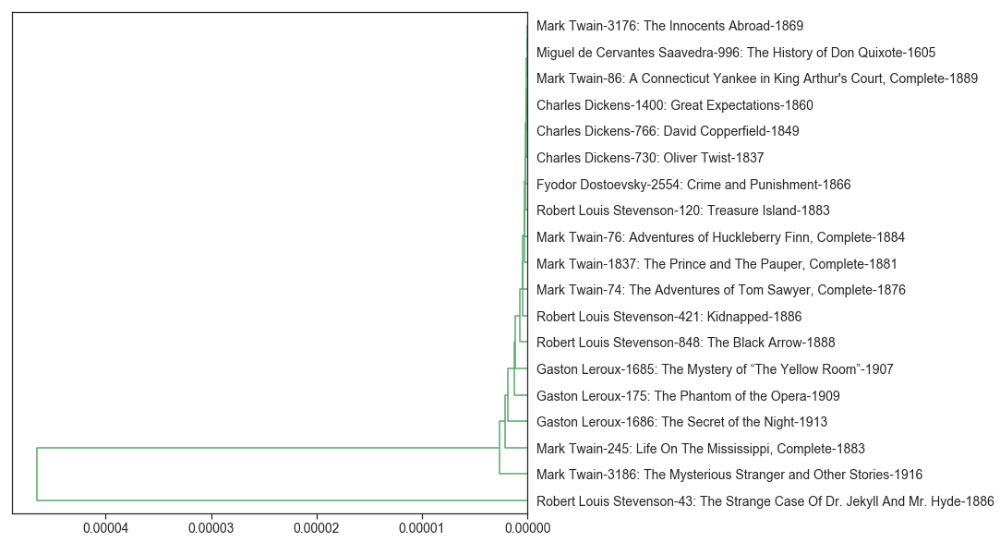

In [272]:
hca(PAIRS.cosine, color_thresh=1)

<Figure size 432x288 with 0 Axes>

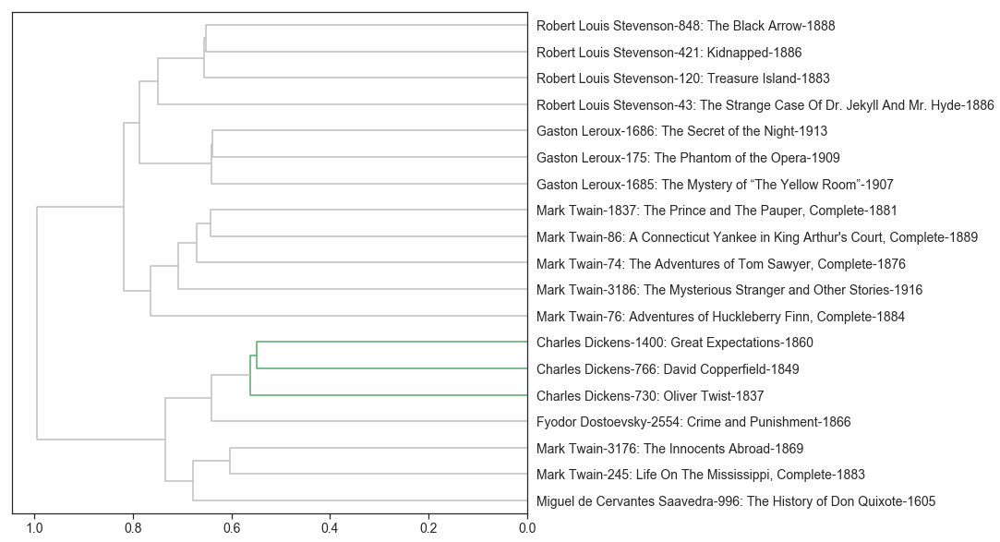

In [273]:
hca(PAIRS.jaccard, color_thresh=.6)

<Figure size 432x288 with 0 Axes>

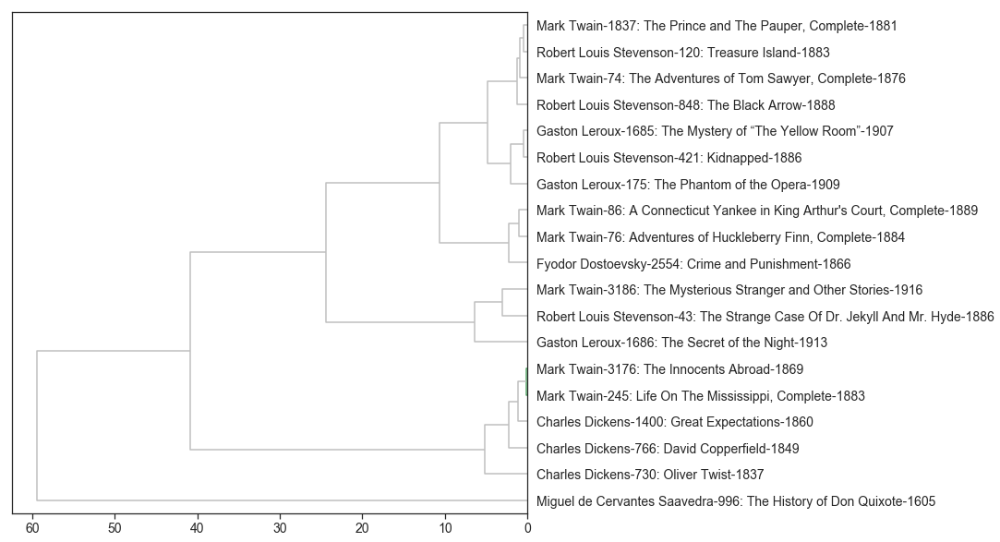

In [274]:
hca(PAIRS.euclidean, color_thresh=.3)

<Figure size 432x288 with 0 Axes>

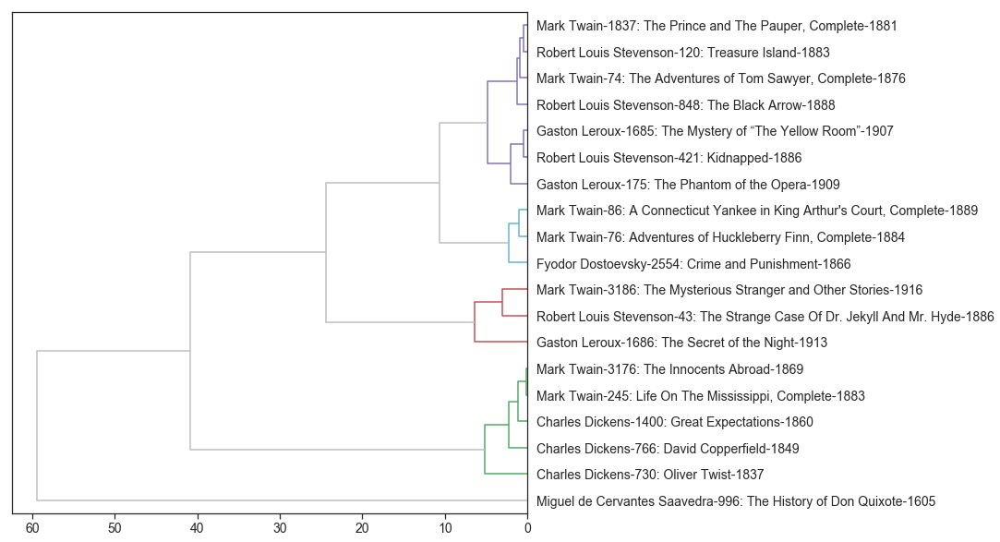

In [275]:
hca(PAIRS.cityblock, color_thresh=8)

<Figure size 432x288 with 0 Axes>

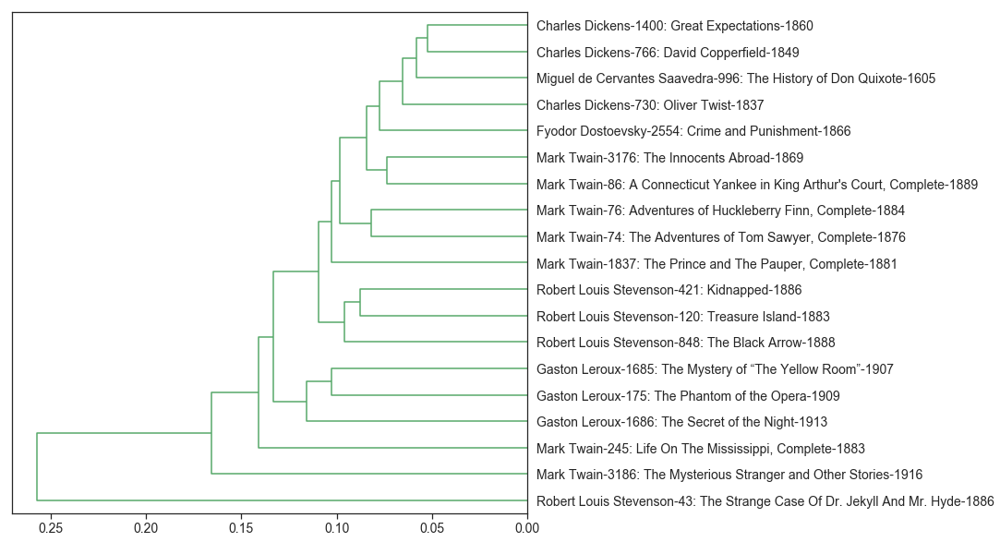

In [276]:
hca(PAIRS.js, color_thresh=.6)

<Figure size 432x288 with 0 Axes>

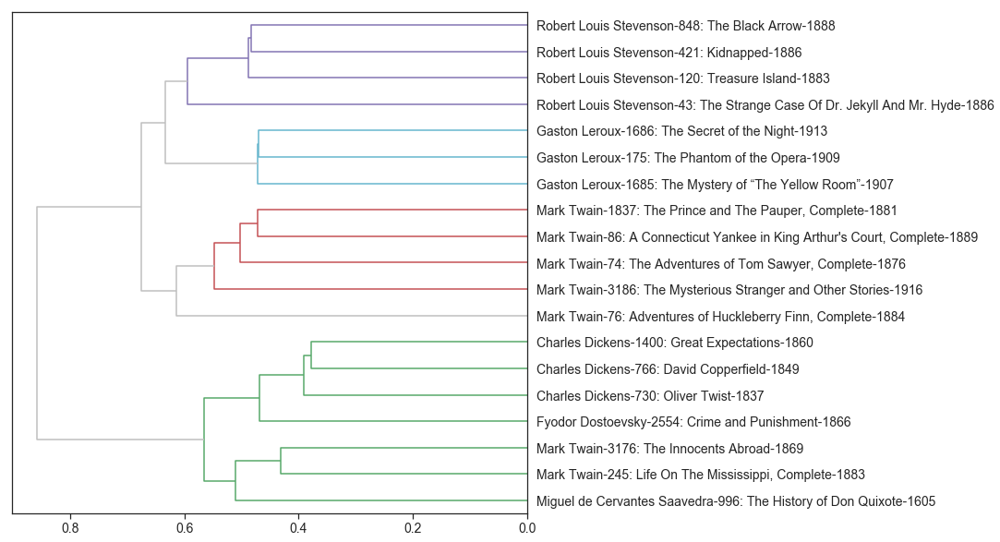

In [277]:
hca(PAIRS.dice, color_thresh=.6)

Jaccard and Dice created the best cluster, grouping together most of the books by authors.

# 6. Conclusions

The writings seem to share similar styles at a lower (i.e. paragraph, chapter) level, regardless of genre. However, they have unique characteristics in terms of topics and central themes at a book level. They also seem to connote distinct cultural backgrounds innately.